In [39]:
import pandas as pd
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.pyplot as plt
from adjustText import adjust_text

import statsmodels.api as sm


import warnings
warnings.filterwarnings("ignore")

# Load unseen-species model data
#path = 'unseen_species_model/unseen_species_model.csv'
#path = 'unseen_species_model/unseen_species_model_no_occupation.csv'


path = '../3-unseen_species_index/unseen_species_model/unseen_species_model_bayesian.csv'

db_extract_path = '../2-cultura_database_extract/db_extract'

df_cultura_original = pd.read_csv(path, index_col = [0])
df_individuals = pd.read_csv(db_extract_path + '/df_individuals_score.csv', index_col = [0])
df_works = pd.read_csv(db_extract_path + '/df_indi__work>2.csv', index_col=[0])


#df_cultura_original = df_cultura_original.rename(columns = {'f0_min':'min_f0', 'f0_max':'max_f0'})

df_cultura_original['N_est'] = df_cultura_original['f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual
df_cultura_original['N_est_min']  =  df_cultura_original['min_f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual
df_cultura_original['N_est_max']  =  df_cultura_original['max_f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual

df_cultura = df_cultura_original.groupby(['region_name', 'decade']).agg({'N_est': 'sum', 'N_est_min':'sum', 'N_est_max':'sum', 'individual_wikidata_id':'count'}).reset_index()
df_cultura = df_cultura.rename(columns={"individual_wikidata_id": "score"})

df_save = df_cultura.copy()
df_save["N_est_log"] = np.log(df_save["N_est"])
df_save["N_est_log_std"] = df_save["N_est_log"] / df_save["N_est_log"].mean()
df_save = df_save.drop(['score'], axis=1)
# df_save.to_csv('df_indicators_hdi/data_for_regression/cpm.csv')
# df_save

In [37]:
df_cultura[df_cultura['region_name']=='Korea']

,region_name,decade,N_est,N_est_min,N_est_max,score
1181,Korea,450,20.834438,15.196432,31.998483,1
1182,Korea,580,2.346484,1.886939,3.154892,1
1183,Korea,640,44.667950,32.407004,67.921172,2
1184,Korea,650,6.598903,4.890790,9.767213,1
1185,Korea,660,6.745642,4.989089,10.034055,1
...,...,...,...,...,...,...
1244,Korea,1840,54.562599,42.111145,75.438541,5
1245,Korea,1850,81.397908,61.835420,116.984061,2
1246,Korea,1860,12.353269,9.511159,17.165721,1
1247,Korea,1870,12.321222,9.482867,17.134231,1


In [ ]:
# Load individuals Data

df_works = df_works.groupby(['decade', 'region_name'])['individual_wikidata_id'].count().reset_index()
df_works = df_works.rename(columns = {'individual_wikidata_id':'f>3'})

df_cultura = pd.merge(df_cultura, df_works, on = ['region_name', 'decade'], how='left')
df_cultura = df_cultura.fillna(0)


df_cultura['N_est'] = df_cultura['N_est'] + df_cultura['f>3']
df_cultura['N_est_min'] = df_cultura['N_est_min'] + df_cultura['f>3']
df_cultura['N_est_max'] = df_cultura['N_est_max'] + df_cultura['f>3']
df_cultura['score'] = df_cultura['score'] + df_cultura['f>3']

# Define a function to rename regions
def rename_region(region):
    if region in ['Arabic world', 'Persian world']:
        return 'MENA'
    else:
        return 'Other'

# ADD MENA
new_df = df_cultura.copy()
# Apply the function to create a new 'Region Group' column
new_df['region_name'] = new_df['region_name'].apply(rename_region)

# Group by the new 'Region Group' and 'decade' columns, then sum the other columns
new_df = new_df.groupby(['region_name', 'decade']).sum().reset_index()

# Now concatenate the aggregated data back to the original dataset
df_cultura = pd.concat([new_df, df_cultura], ignore_index=True)


df_individuals_bis = df_individuals.copy()
df_individuals_bis['region_name']=df_individuals_bis['region_name'].apply(rename_region)
df_individuals = pd.concat([df_individuals, df_individuals_bis], ignore_index=True)


array(['MENA', 'Other', 'Arabic world', 'Central Europe', 'Chinese world',
       'East Slavic', 'France', 'German world', 'Greek World',
       'Indian world', 'Italy', 'Japan', 'Korea', 'Latin World',
       'Low countries', 'Nordic countries', 'Northern China',
       'Northern Japan', 'Northwestern Europe', 'Persian world',
       'Portugal', 'Southern China', 'Southern Japan',
       'Southwestern Europe', 'Spain', 'United Kingdom'], dtype=object)

In [ ]:



regions_eu = ['Latin World',
'Portugal',
'Italy',
#  'Greek World',
'Spain',
'Nordic countries',
'German world',
'Low countries',
'France',
'United Kingdom']

df_europe= df_cultura[df_cultura['region_name'].isin(regions_eu)]
df_europe['region_name'] = 'Western Europe'

df_cultura = pd.concat([df_cultura, df_europe])


df_individuals_europe = df_individuals[df_individuals['region_name'].isin(regions_eu)]
df_individuals =  pd.concat([df_individuals, df_individuals_europe])

### Make function

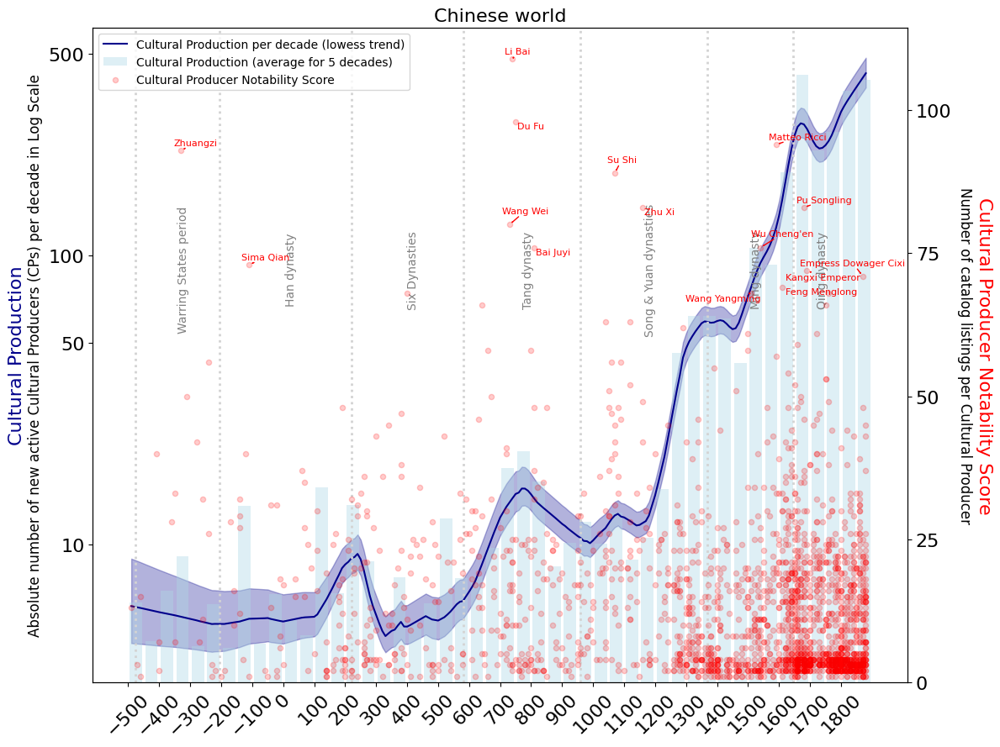

In [4]:
def plot_figure(region_name, 
                max_year, 
                min_year, 
                period_data, 
                year_step = 200, 
                plot_names = True, 
                frac = 0.1, 
                top_n_individuals = 15,
                plot_bars = False,
                plot_original_trend = False,
                yticks = [5, 10, 50, 100, 500, 1000, 2000],
                fifty = False,
                log=True,
                legend=False,
                plot_name_names=True,
                fontsize_title=16,
                fontsize_axis_ticks = 16,
                fontsize_axis_name = 16,
                show_real_values = True,
                first_axis_sub_text_location = -0.11,
                second_axis_sub_text_location = 1.07,
                plot_histogram = True,
                histogram_bin_years = 50,  # NEW PARAMETER: controls histogram bin size in years
                show_y_axis_titles = True,  # NEW PARAMETER: controls y-axis titles visibility
                show_legends = True):  # NEW PARAMETER: controls legend visibility


    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name])]
        

    df = df_cultura[df_cultura['region_name'].isin([region_name])]

    if fifty:
            df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
            df = df.groupby(['region_name', 'decade']).sum().reset_index()

    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    # Store original values before log transformation
    df_original = df.copy()
    
    # Create histogram bins based on the new parameter
    if plot_histogram:
        # Create bins of the specified size
        df_hist = df_original.copy()
        if histogram_bin_years == 10:  # Per decade
            df_hist['year_bin'] = df_hist['decade']  # Use decade as is
            df_hist_grouped = df_hist.groupby('year_bin')['N_est'].mean().reset_index()
            df_hist_grouped['year_bin_center'] = df_hist_grouped['year_bin']
            bar_width = 8  # Narrower bars for decades
        else:  # For any other bin size (50 years, 100 years, etc.)
            df_hist['year_bin'] = (df_hist['decade'] // histogram_bin_years) * histogram_bin_years
            df_hist_grouped = df_hist.groupby('year_bin')['N_est'].mean().reset_index()
            df_hist_grouped['year_bin_center'] = df_hist_grouped['year_bin'] + (histogram_bin_years / 2)  # Center of each bin
            bar_width = histogram_bin_years * 0.8  # Bar width proportional to bin size
    
    if log:
        df['N_est'] = np.log(df['N_est'])  # Applying log transformation
        df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
        df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
        df['score'] = np.log(df['score'])  # Max bound log

    # Define your color scheme
    colors = {
        region_name: "#00008b",
    }

    fig, ax = plt.subplots(figsize=(12, 9))
    ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis

    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)

        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)

        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label ='Cultural Production per decade (lowess trend)', color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Store y-axis limits before adding histogram to maintain consistent scaling
    y_limits_after_line = ax.get_ylim()
    
    # Plot histogram bars with configurable bin size
    if plot_histogram:
        if log:
            # Convert histogram values to log scale for plotting
            hist_log_values = np.log(df_hist_grouped['N_est'])
            ax.bar(df_hist_grouped['year_bin_center'], hist_log_values, 
                   width=bar_width, alpha=0.4, color='lightblue', 
                   label=f'Cultural Production (average for 5 decades)', zorder=1)
    
        
        # Restore the y-axis limits to what they were before adding the histogram
        ax.set_ylim(y_limits_after_line)

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()

    if plot_original_trend:
        # Adding smoothing and plotting for each region
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)

            # LOESS smoothing
            smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
            
            # Update maximum n_est if current is higher
            max_n_est = max(max_n_est, max(smoothed[:, 1]))

            # Plotting the smoothed mean estimate
            ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#006400', linewidth=3, linestyle='-')

    if plot_names:
        # Collect texts from each region separately and adjust
        region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
        region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')
        region_individuals = region_individuals.sort_values('score', ascending=False)
        top_individuals = region_individuals.head(top_n_individuals)

        # Plot scatter for all individuals
        all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
        ax2.scatter(region_individuals['decade'], all_scores_normalized, color='red', alpha=0.2, s=20, label='Cultural Producer Notability Score')

        if plot_name_names:
            texts = []  # Initialize a new list for this region's texts

            # Texts for top 15
            for _, row in top_individuals.iterrows():
                score_normalized = (row['score'] / max_global_score) * max_n_est
                text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
                            ha='center', va='bottom', color='red',fontsize=8)
                texts.append(text)

            # Use adjust_text for the current region with the corresponding arrow color
            adjust_text(texts, arrowprops=dict(arrowstyle="->", color="red"))

    if period_data:
        # Adding labels and vertical lines for each period
        for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
            start, end = intercept
            midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
            # Add vertical line at the start of each period
            ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
            # Add text label at the midpoint of the period, shifted upwards
            ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')

    if plot_bars:
        # Plot bars from the real values
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)
            # Bars representing the scores
            ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha = 0.1, zorder=2)

    # Add real values annotations if requested and using log scale
    if show_real_values and log:
        # Get some representative points to show real values
        for region in df_original['region_name'].unique():
            region_data_orig = df_original[df_original['region_name'] == region]
            region_data_orig.sort_values(by='decade', inplace=True)
            
            # Get the smoothed line data for this region
            smoothed = sm.nonparametric.lowess(df[df['region_name'] == region]['N_est'], 
                                             df[df['region_name'] == region]['decade'], 
                                             frac=frac)
            
            # Select every few points to avoid cluttering
            step = max(1, len(smoothed) // 4)  # Show about 6 points
            sample_indices = range(0, len(smoothed), step)
            
            for i in sample_indices:
                if i < len(smoothed):
                    decade = smoothed[i, 0]
                    smoothed_log_value = smoothed[i, 1]
                    
                    # Convert the smoothed log value back to real value
                    # Since we did: log_value = np.log(real_value)
                    # We reverse it: real_value = np.exp(log_value)
                    real_value_from_smoothed = np.exp(smoothed_log_value)
                    
                    # # Round using smart rounding
                    # rounded_real = smart_round(real_value_from_smoothed)
                    
                    # # Add annotation at the smoothed line position with year included
                    # ax.annotate(f'{int(rounded_real):,} CPs', 
                    #           xy=(decade, smoothed_log_value), 
                    #           xytext=(5, 10), 
                    #           textcoords='offset points',
                    #           fontsize=8, 
                    #           color='navy',
                    #           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7),
                    #           ha='left', va='center')

    # Set custom y-ticks to show the relationship between log and real values
    if log and show_real_values:
        # Create custom ticks that correspond to nice real values for primary y-axis
        real_tick_values = [10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000]
        log_tick_values = [np.log(val) for val in real_tick_values]
        
        # Filter to only include ticks within the data range
        y_min, y_max = ax.get_ylim()
        valid_ticks = [(log_val, real_val) for log_val, real_val in zip(log_tick_values, real_tick_values) 
                       if y_min <= log_val <= y_max]
        
        if valid_ticks:
            log_ticks, real_labels = zip(*valid_ticks)
            ax.set_yticks(log_ticks)
            ax.set_yticklabels([f'{int(val):,}' for val in real_labels])
        
        # Set custom y-ticks for secondary y-axis (Cultural Producer Score)
        if plot_names:
            # Get the range of normalized scores on ax2
            y2_min, y2_max = ax2.get_ylim()
            
            # Convert normalized positions back to original score values to determine range
            if max_n_est > 0:
                original_score_min = (y2_min * max_global_score) / max_n_est
                original_score_max = (y2_max * max_global_score) / max_n_est
                
                # Create ticks every 25 units in original score space
                tick_start = int(np.ceil(original_score_min / 25) * 25)  # Round up to next 25
                tick_end = int(np.floor(original_score_max / 25) * 25)   # Round down to prev 25
                
                original_score_ticks = list(range(tick_start, tick_end + 1, 25))
                
                # Convert back to normalized positions for plotting
                normalized_tick_positions = [(score * max_n_est) / max_global_score for score in original_score_ticks]
                
                # Filter to only include ticks within the actual y-axis range
                valid_ticks = [(norm_pos, orig_score) for norm_pos, orig_score in zip(normalized_tick_positions, original_score_ticks) 
                              if y2_min <= norm_pos <= y2_max]
                
                if valid_ticks:
                    norm_positions, orig_scores = zip(*valid_ticks)
                    ax2.set_yticks(norm_positions)
                    ax2.set_yticklabels([f'{int(score):,}' for score in orig_scores])

    # Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
    ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size

    # Set y-axis limits to start from 0 for the secondary axis
    if plot_names:
        y2_min, y2_max = ax2.get_ylim()
        ax2.set_ylim(bottom=0)

    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')

    STROKE = 1.3

    # Y-axis titles (controlled by show_y_axis_titles parameter)
    if show_y_axis_titles:
        if log:
            if show_real_values:
                # Create the main y-label in blue (same as line color)
                ax.set_ylabel('Cultural Production', fontsize=fontsize_axis_name, labelpad=20, color='#00008b')
                # Position smaller text further left and lower in black
                ax.text(first_axis_sub_text_location, 0.5, 'Absolute number of new active Cultural Producers (CPs) per decade in Log Scale', 
                        transform=ax.transAxes, fontsize=fontsize_axis_name*0.75, 
                        rotation=90, ha='center', va='center', color='black')

            if plot_names and show_real_values:
                # Create the secondary y-label in red
                ax2.set_ylabel('Cultural Producer Notability Score', fontsize=fontsize_axis_name, labelpad=35, rotation=-90, color='red')
                ax2.text(second_axis_sub_text_location, 0.50, "Number of catalog listings per Cultural Producer", 
                        transform=ax2.transAxes, fontsize=fontsize_axis_name*0.75, 
                        rotation=-90, ha='center', va='center', color='black')
            else:
                ax2.set_ylabel('Cultural Producer Score', fontsize=fontsize_axis_name, labelpad=20, color='red')
        else:
            ax.set_ylabel('Cultural Production', fontsize=fontsize_axis_name, color='#00008b')
    
    ax.set_title(region_name, fontsize=fontsize_title)
    
    # Legend handling (controlled by show_legends parameter)
    if show_legends:
        if plot_original_trend or plot_histogram or plot_names:
            # Combine legends from both axes
            lines1, labels1 = ax.get_legend_handles_labels()
            if plot_names:
                lines2, labels2 = ax2.get_legend_handles_labels()
                ax.legend(lines1 + lines2, labels1 + labels2, loc='best')
            else:
                ax.legend()
        else:
            ax.legend().remove()  # This conditionally removes the legend
    else:
        # Remove any existing legends when show_legends is False
        legend = ax.get_legend()
        if legend:
            legend.remove()
    
    plt.tight_layout()  # Add this to prevent label cutoff
    plt.show()



region_name = 'Chinese world'
min_year = -500
max_year = 1880


chinese_period_data = {
    "x_intercepts": [
        # [-800, -476],
        [-476, -206],
        [-206, 220],
        [220, 581],
        [581, 960],
        [960, 1368],
        [1368, 1644],
        [1644, 1800]
    ],
    "labels": [
        # "Spring and Autumn period",
        "Warring States period",
        "Han dynasty",
        "Six Dynasties",
        "Tang dynasty",
        "Song & Yuan dynasties",
        "Ming dynasty",
        "Qing dynasty"
    ]
}


plot_figure(region_name, max_year, min_year, period_data=chinese_period_data, 
            first_axis_sub_text_location = -0.07,
            year_step = 100, plot_original_trend = False, fifty=False, frac=0.1,
            plot_histogram = True, histogram_bin_years=50)

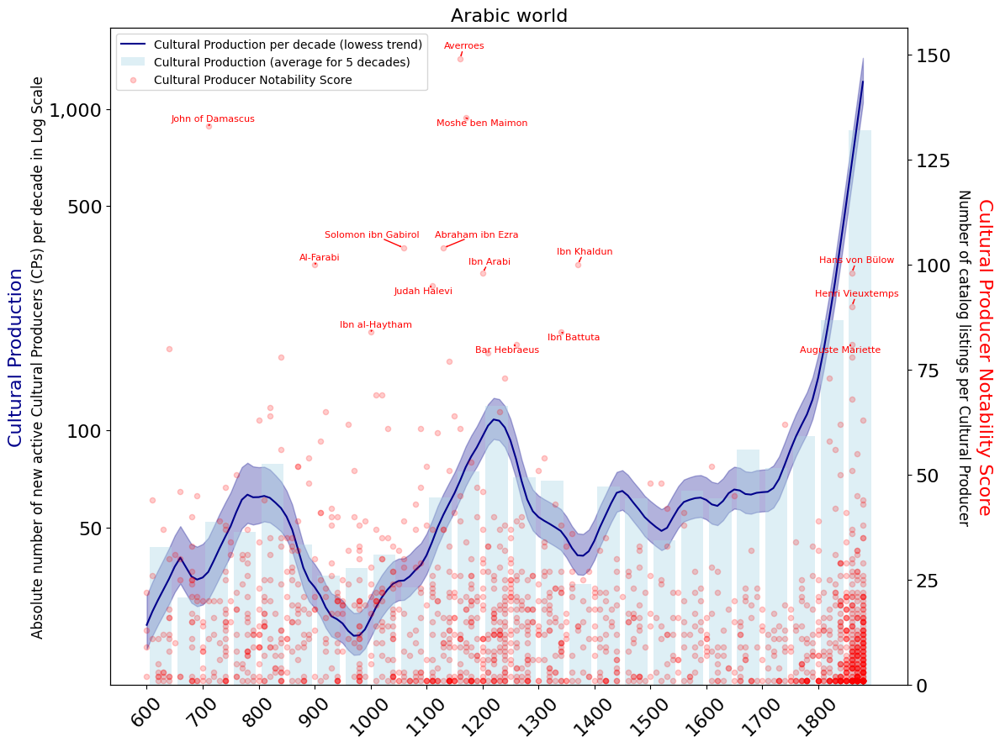

In [5]:
plot_figure(region_name='Arabic world', 
            max_year=1880, 
            min_year=600, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.1,
            histogram_bin_years = 50,
             first_axis_sub_text_location = -0.09,)

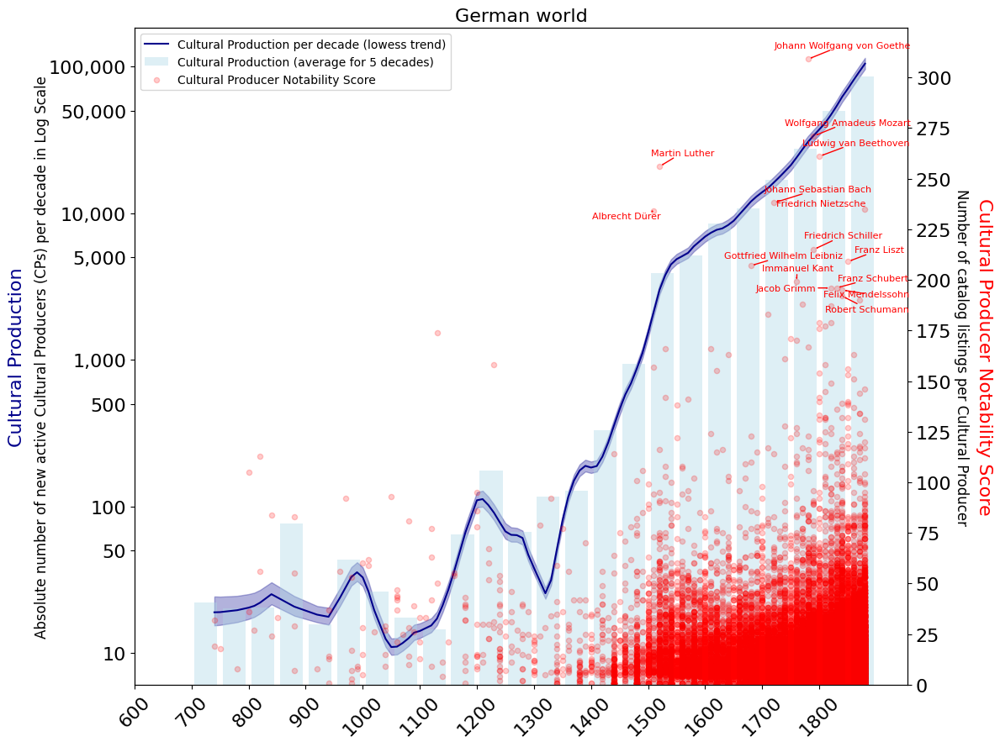

In [6]:
plot_figure(region_name='German world', 
            max_year=1880, 
            min_year=600, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.1,
            histogram_bin_years = 50, first_axis_sub_text_location = -0.12)

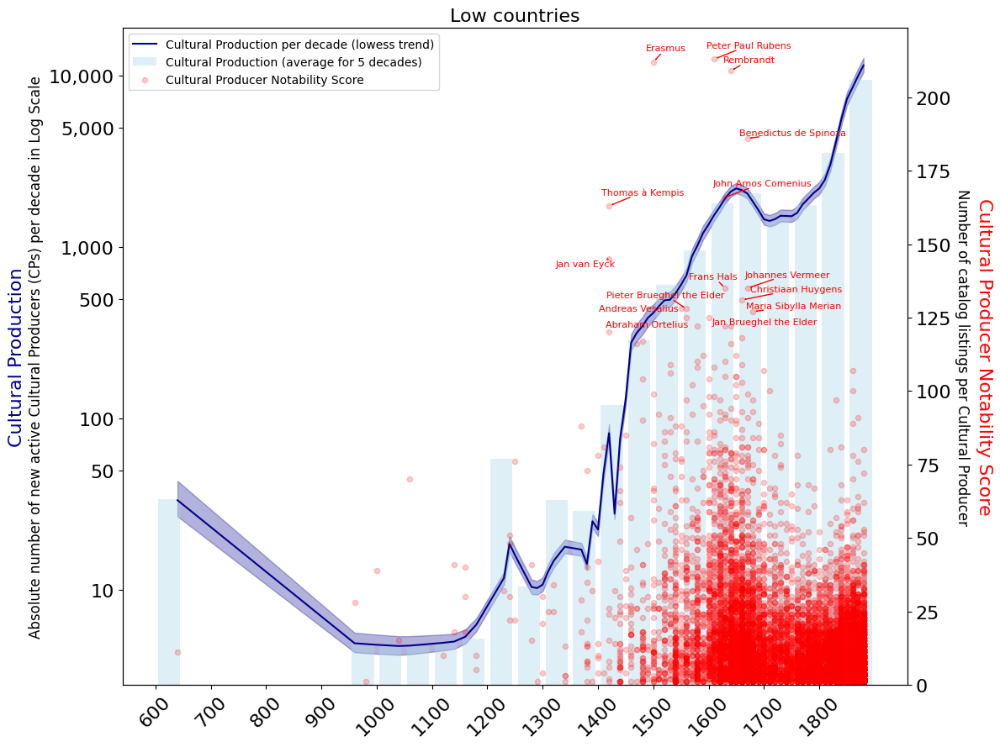

In [7]:
plot_figure(region_name='Low countries', 
            max_year=1880, 
            min_year=600, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.1,
            histogram_bin_years = 50)

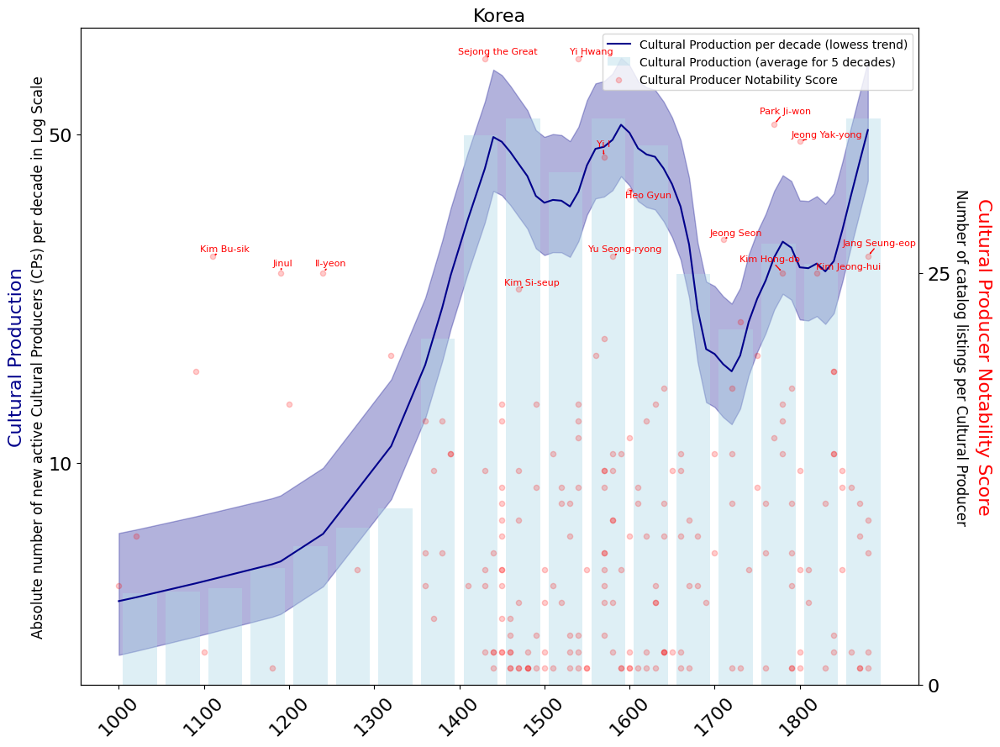

In [8]:
plot_figure(region_name='Korea', 
            max_year=1880, 
            min_year=1000, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.2,
            histogram_bin_years = 50,  first_axis_sub_text_location = -0.05, 
            second_axis_sub_text_location = 1.05)

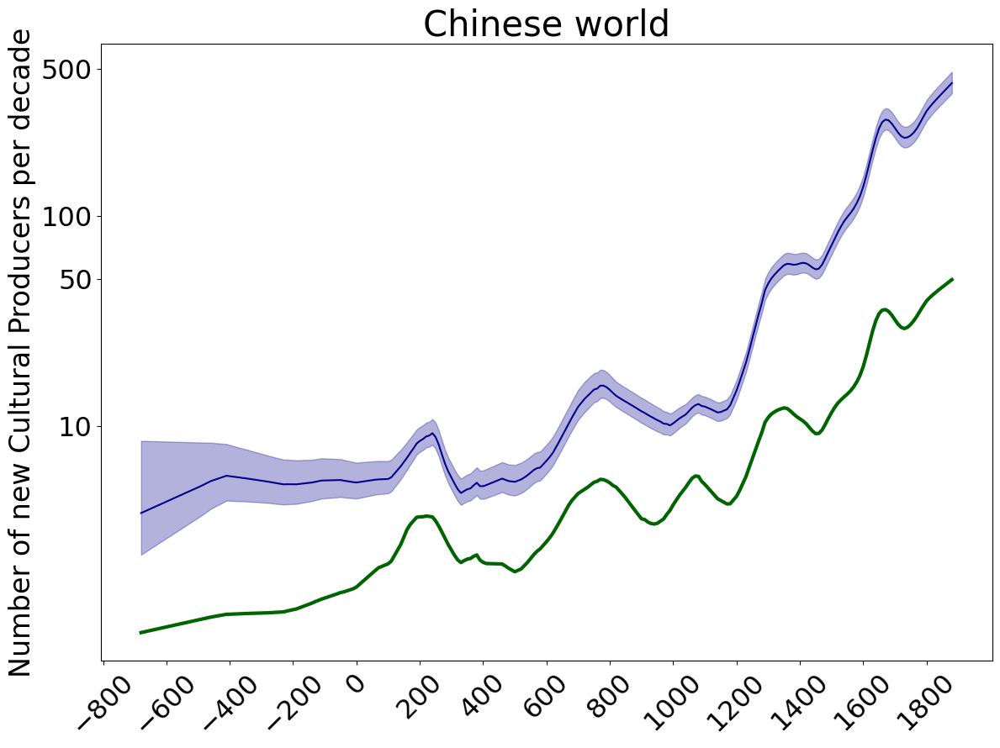

In [9]:
def plot_figure_simplified(region_name, 
                max_year, 
                min_year, 
                period_data, 
                year_step = 200, 
                plot_names = True, 
                frac = 0.1, 
                top_n_individuals = 15,
                plot_bars = False,
                plot_original_trend = False,
                yticks = [5, 10, 50, 100, 500, 1000, 2000],
                fifty = False,
                log=True,
                legend=False,
                plot_name_names=True,
                fontsize_title=16,
                fontsize_axis_ticks = 16,
                fontsize_axis_name = 16,
                show_real_values = True,
                first_axis_sub_text_location = -0.11,
                plot_histogram = True,
                histogram_bin_years = 50,  # NEW PARAMETER: controls histogram bin size in years
                show_y_axis_titles = True,  # NEW PARAMETER: controls y-axis titles visibility
                show_legends = True):  # NEW PARAMETER: controls legend visibility


    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name])]
        

    df = df_cultura[df_cultura['region_name'].isin([region_name])]

    if fifty:
            df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
            df = df.groupby(['region_name', 'decade']).sum().reset_index()

    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    # Store original values before log transformation
    df_original = df.copy()

    if log:
        df['N_est'] = np.log(df['N_est'])  # Applying log transformation
        df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
        df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
        df['score'] = np.log(df['score'])  # Max bound log

    # Define your color scheme
    colors = {
        region_name: "#00008b",
    }

    fig, ax = plt.subplots(figsize=(12, 9))

    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)

        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)

        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label ='Cultural Production per decade (lowess trend)', color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Store y-axis limits before adding histogram to maintain consistent scaling
    y_limits_after_line = ax.get_ylim()
    
  

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()

    if plot_original_trend:
        # Adding smoothing and plotting for each region
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)

            # LOESS smoothing
            smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
            
            # Update maximum n_est if current is higher
            max_n_est = max(max_n_est, max(smoothed[:, 1]))

            # Plotting the smoothed mean estimate
            ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#006400', linewidth=3, linestyle='-')



    # Add real values annotations if requested and using log scale
    if show_real_values and log:
        # Get some representative points to show real values
        for region in df_original['region_name'].unique():
            region_data_orig = df_original[df_original['region_name'] == region]
            region_data_orig.sort_values(by='decade', inplace=True)
            
            # Get the smoothed line data for this region
            smoothed = sm.nonparametric.lowess(df[df['region_name'] == region]['N_est'], 
                                             df[df['region_name'] == region]['decade'], 
                                             frac=frac)
            
            # Select every few points to avoid cluttering
            step = max(1, len(smoothed) // 4)  # Show about 6 points
            sample_indices = range(0, len(smoothed), step)
            
            for i in sample_indices:
                if i < len(smoothed):
                    decade = smoothed[i, 0]
                    smoothed_log_value = smoothed[i, 1]
                    
                    # Convert the smoothed log value back to real value
                    # Since we did: log_value = np.log(real_value)
                    # We reverse it: real_value = np.exp(log_value)
                    real_value_from_smoothed = np.exp(smoothed_log_value)
                    
                    # Round using smart rounding
                    # rounded_real = smart_round(real_value_from_smoothed)
                    
                    # # Add annotation at the smoothed line position with year included
                    # ax.annotate(f'{int(rounded_real):,} CPs', 
                    #           xy=(decade, smoothed_log_value), 
                    #           xytext=(5, 10), 
                    #           textcoords='offset points',
                    #           fontsize=8, 
                    #           color='navy',
                    #           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7),
                    #           ha='left', va='center')

    # Set custom y-ticks to show the relationship between log and real values
    if log and show_real_values:
        # Create custom ticks that correspond to nice real values for primary y-axis
        real_tick_values = [10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000]
        log_tick_values = [np.log(val) for val in real_tick_values]
        
        # Filter to only include ticks within the data range
        y_min, y_max = ax.get_ylim()
        valid_ticks = [(log_val, real_val) for log_val, real_val in zip(log_tick_values, real_tick_values) 
                       if y_min <= log_val <= y_max]
        
        if valid_ticks:
            log_ticks, real_labels = zip(*valid_ticks)
            ax.set_yticks(log_ticks)
            ax.set_yticklabels([f'{int(val):,}' for val in real_labels])

                
            
    # Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size


    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')

    STROKE = 1.3

    # Y-axis titles (controlled by show_y_axis_titles parameter)
    if show_y_axis_titles:
        if log:
            if show_real_values:
                # Create the main y-label in blue (same as line color)
                ax.set_ylabel('Number of new Cultural Producers per decade', fontsize=fontsize_axis_name)
                # Position smaller text further left and lower in black
      

        else:
            ax.set_ylabel('Cultural Production', fontsize=fontsize_axis_name, color='#00008b')
    
    ax.set_title(region_name, fontsize=fontsize_title)
    
    # Legend handling (controlled by show_legends parameter)
    if show_legends:
        if plot_original_trend or plot_histogram or plot_names:
            # Combine legends from both axes
            lines1, labels1 = ax.get_legend_handles_labels()
        else:
            ax.legend().remove()  # This conditionally removes the legend
    else:
        # Remove any existing legends when show_legends is False
        legend = ax.get_legend()
        if legend:
            legend.remove()
    
    plt.tight_layout()  # Add this to prevent label cutoff
    plt.show()



region_name = 'Chinese world'
min_year = -800
max_year = 1880



plot_figure_simplified(region_name, max_year, min_year, period_data=None, 
            first_axis_sub_text_location = -0.07,
            year_step = 200, plot_original_trend = True, fifty=False, frac=0.1,
            plot_histogram = True, histogram_bin_years=50,fontsize_title=30,
                fontsize_axis_ticks = 23,  fontsize_axis_name = 24)

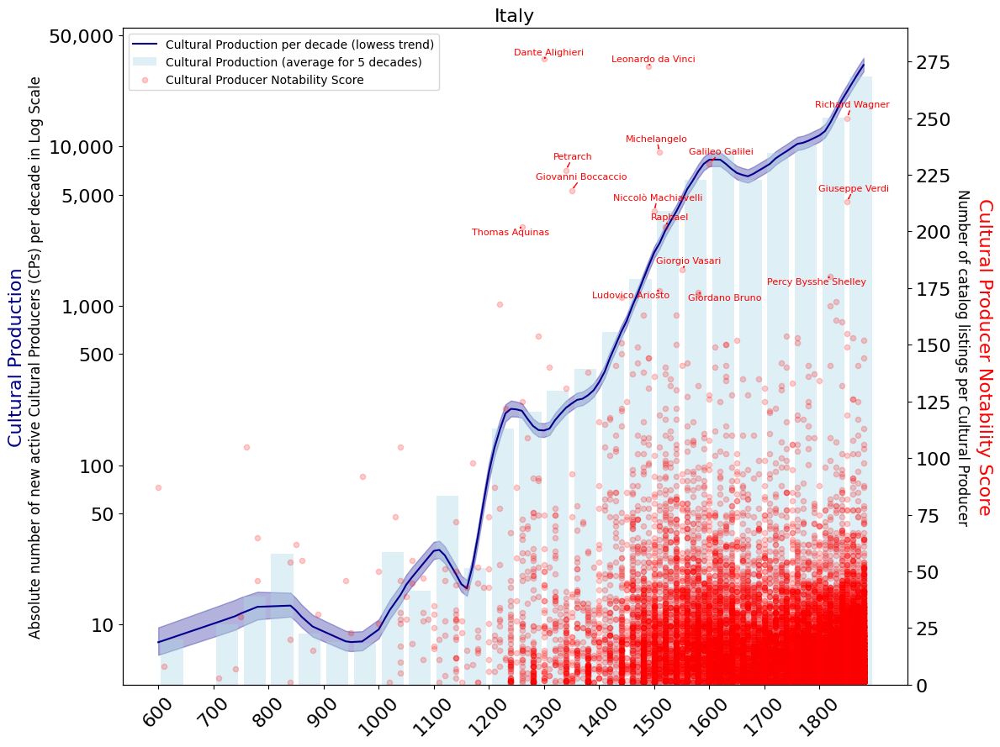

In [10]:
fig_france = plot_figure(region_name='Italy', 
            max_year=1880, 
            min_year=600, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.1,
            histogram_bin_years = 50)

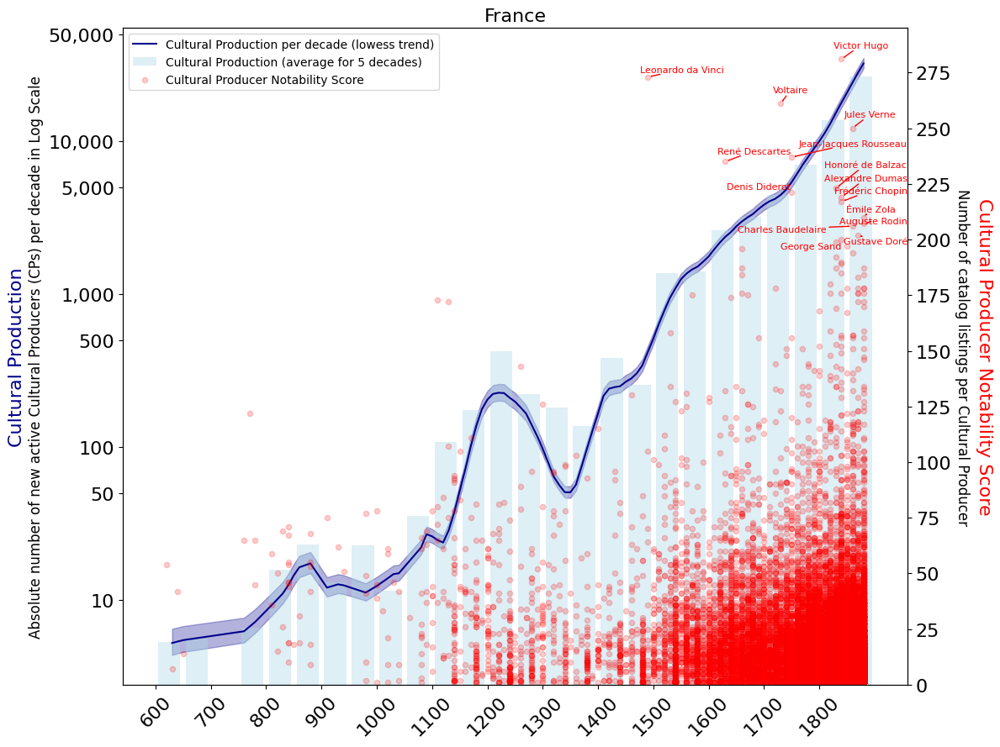

In [11]:
fig_france = plot_figure(region_name='France', 
            max_year=1880, 
            min_year=600, 
            plot_names=True,
            period_data=None, 
            year_step = 100, 
            top_n_individuals = 15, 
            plot_original_trend = False, 
            fifty=False, 
            frac=0.1,
            histogram_bin_years = 50)

In [12]:
df_test = df_cultura[df_cultura['decade']==1880]
df_test['N_est'] = df_test['N_est'].astype(int)
list(df_test['region_name'].unique())

eu_regions = ['Central Europe',
 'East Slavic',
 'France',
 'German world',
 'Italy',
 'Low countries',
 'Nordic countries',
 'Portugal',
 'Spain',
 'United Kingdom']

df_test = df_test[df_test['region_name'].isin(eu_regions)]
df_test

,region_name,decade,N_est,N_est_min,N_est_max,score,f>3
682,Central Europe,1880,57947,51847.304579,65498.110570,1560.0,156.0
910,East Slavic,1880,20442,18155.070115,23419.662107,806.0,77.0
1011,France,1880,32489,30025.208851,35359.970169,2447.0,357.0
1111,German world,1880,115214,105890.533728,126261.139618,3889.0,351.0
1500,Italy,1880,32322,29487.128853,35773.937702,1193.0,75.0
1813,Low countries,1880,12211,11139.435589,13496.811354,764.0,88.0
1879,Nordic countries,1880,19917,17937.874761,22369.013251,943.0,130.0
2297,Portugal,1880,2182,1764.843474,2810.078157,100.0,14.0
2739,Spain,1880,15792,14171.751608,17756.981230,754.0,98.0
2828,United Kingdom,1880,18997,17492.486406,20723.576091,1614.0,262.0


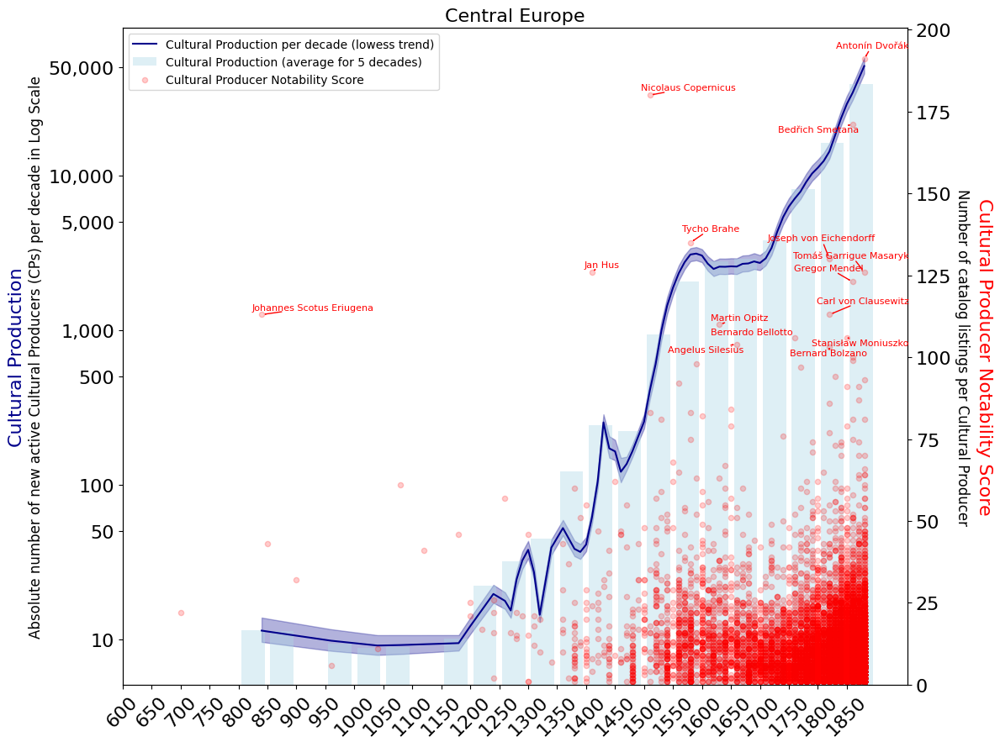

In [13]:
plot_figure(region_name='Central Europe', max_year=1880, min_year=600, period_data=None, year_step = 50, plot_original_trend = False, fifty=False, frac=0.1)

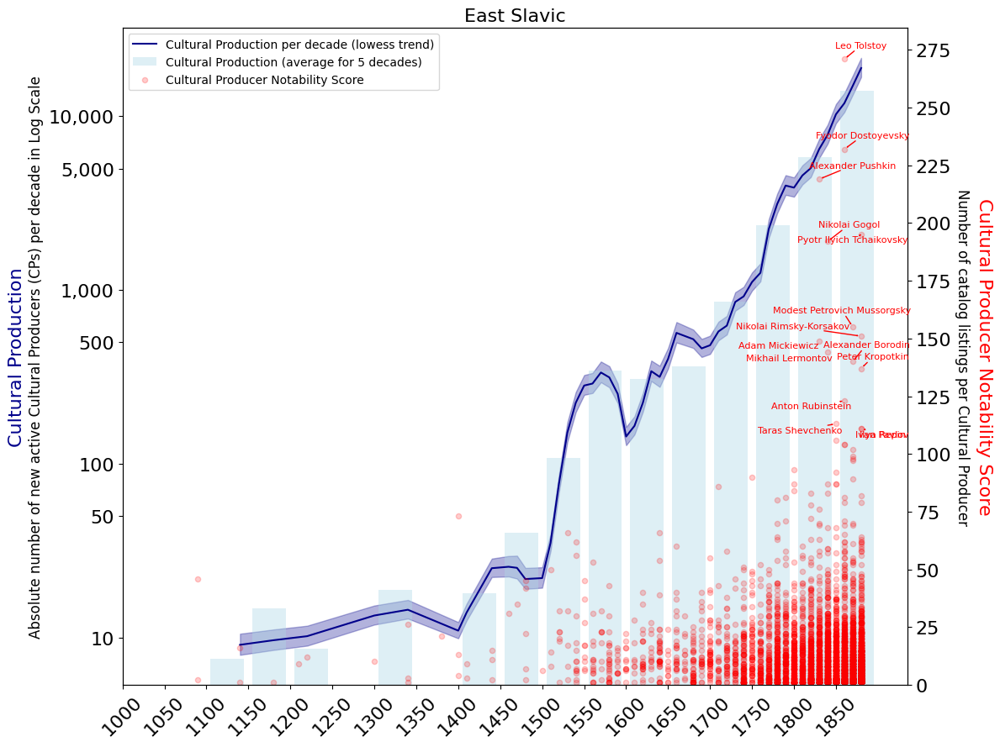

In [14]:
plot_figure(region_name='East Slavic', max_year=1880, min_year=1000, period_data=None, year_step = 50, plot_original_trend = False, fifty=False, frac=0.1)


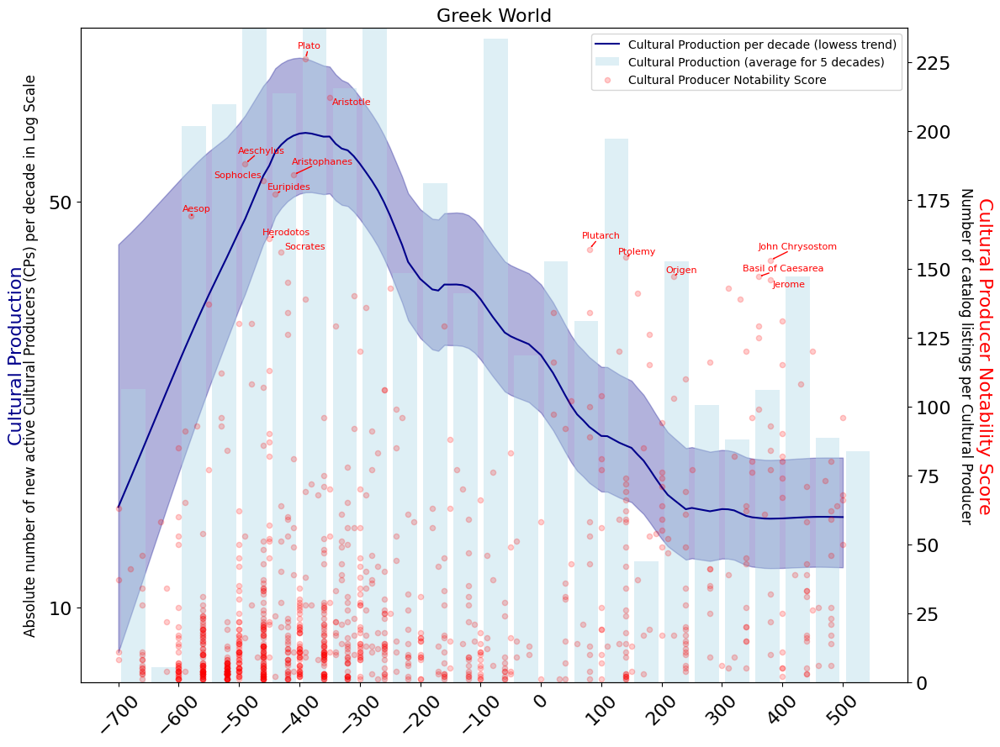

In [15]:
plot_figure(region_name='Greek World',  
            min_year=-700, max_year=500,period_data=None, year_step = 100, plot_original_trend = False, 
            fifty=False, frac=0.3,
             first_axis_sub_text_location = -0.06)


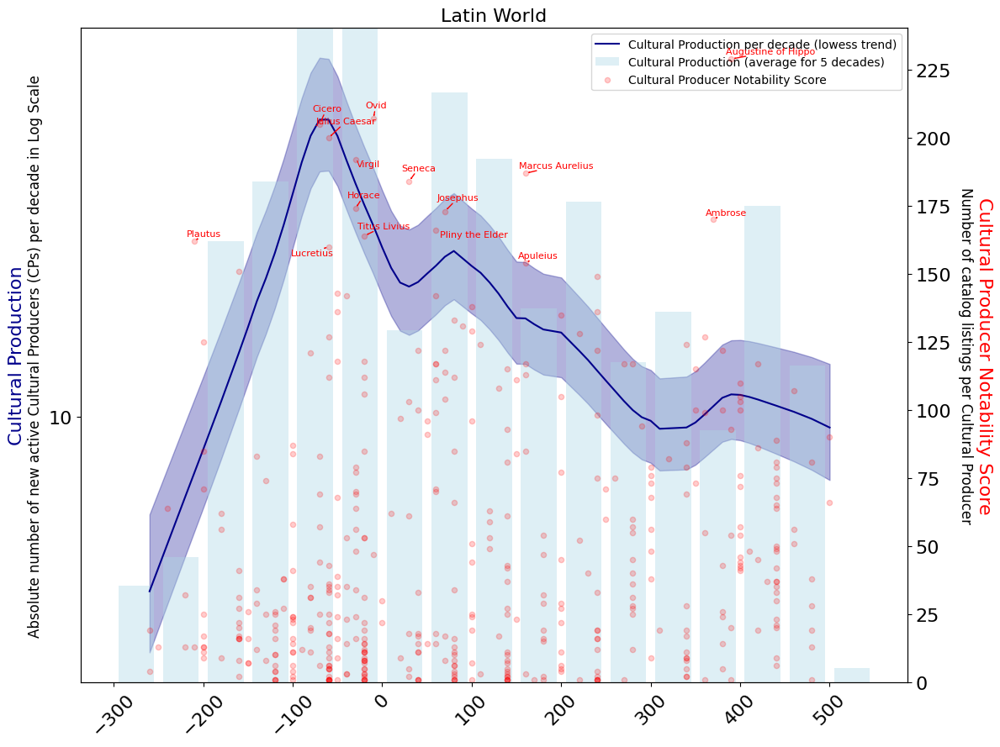

In [16]:
plot_figure(region_name='Latin World',  min_year=-300, max_year=500,period_data=None, 
            year_step = 100, plot_original_trend = False, fifty=False, frac=0.3,  
            first_axis_sub_text_location = -0.055)


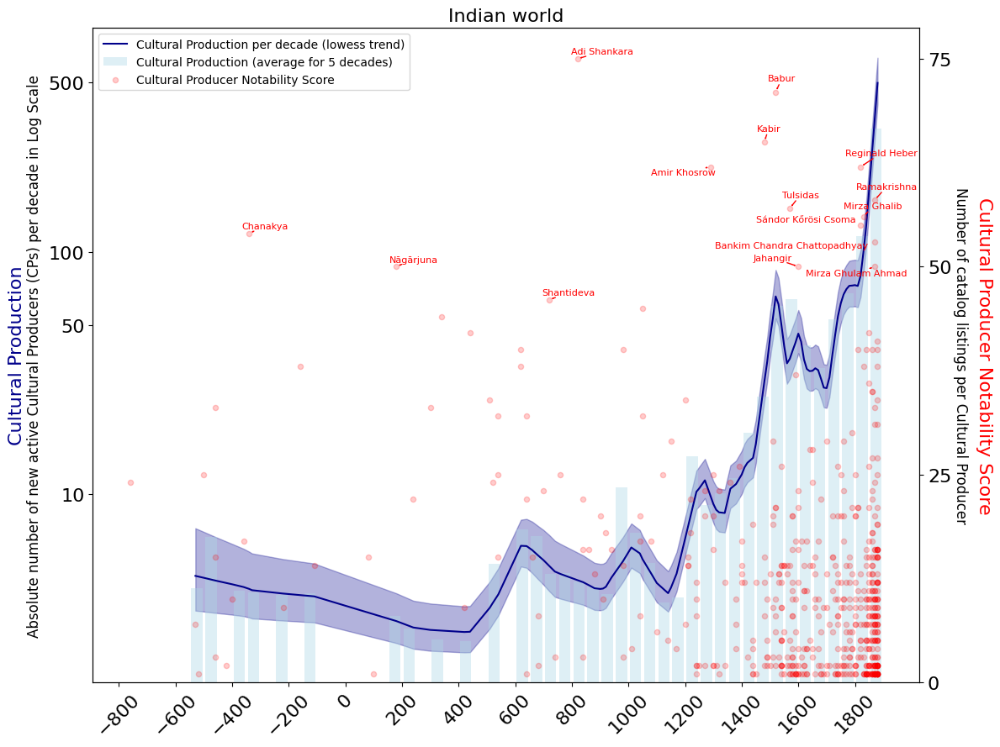

In [17]:
plot_figure(region_name='Indian world',  min_year=-800, max_year=1880,period_data=None, 
            year_step = 200, plot_original_trend = False, fifty=False, frac=0.1,
            first_axis_sub_text_location = -0.07, second_axis_sub_text_location = 1.05)


{'Arabic world',
 'Central Europe',
 'Chinese world',
 'East Slavic',
 'France',
 'German world',
 'Greek World',
 'Indian world',
 'Italy',
 'Japan',
 'Korea',
 'Latin World',
 'Low countries',
 'MENA',
 'Nordic countries',
 'Northern China',
 'Northern Japan',
 'Northwestern Europe',
 'Other',
 'Persian world',
 'Portugal',
 'Southern China',
 'Southern Japan',
 'Southwestern Europe',
 'Spain',
 'United Kingdom',
 'Western Europe'}

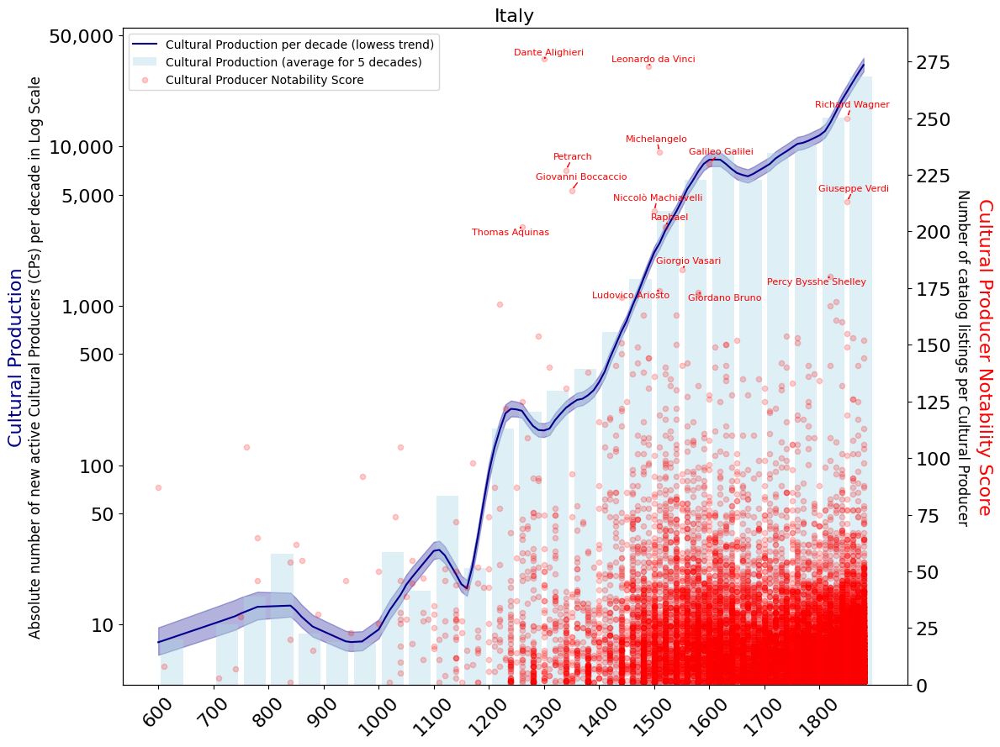

In [18]:
plot_figure(region_name='Italy',  min_year=600, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.1)


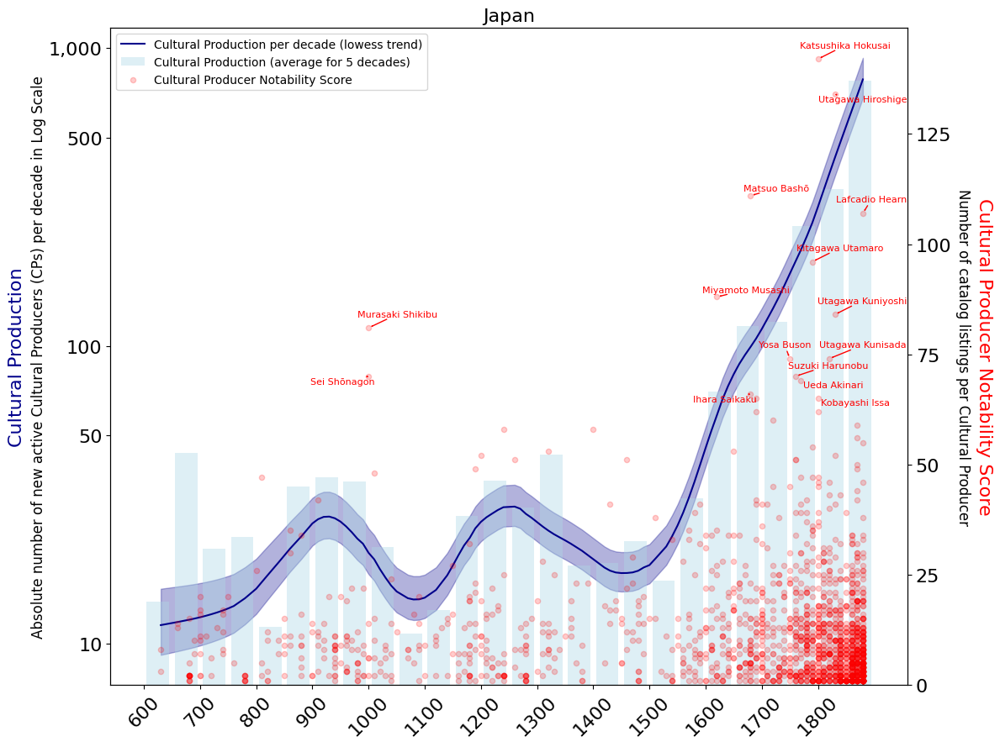

In [19]:
plot_figure(region_name='Japan',  min_year=600, max_year=1880,period_data=None, 
            year_step = 100, plot_original_trend = False, 
            fifty=False, frac=0.2, first_axis_sub_text_location = -0.09)


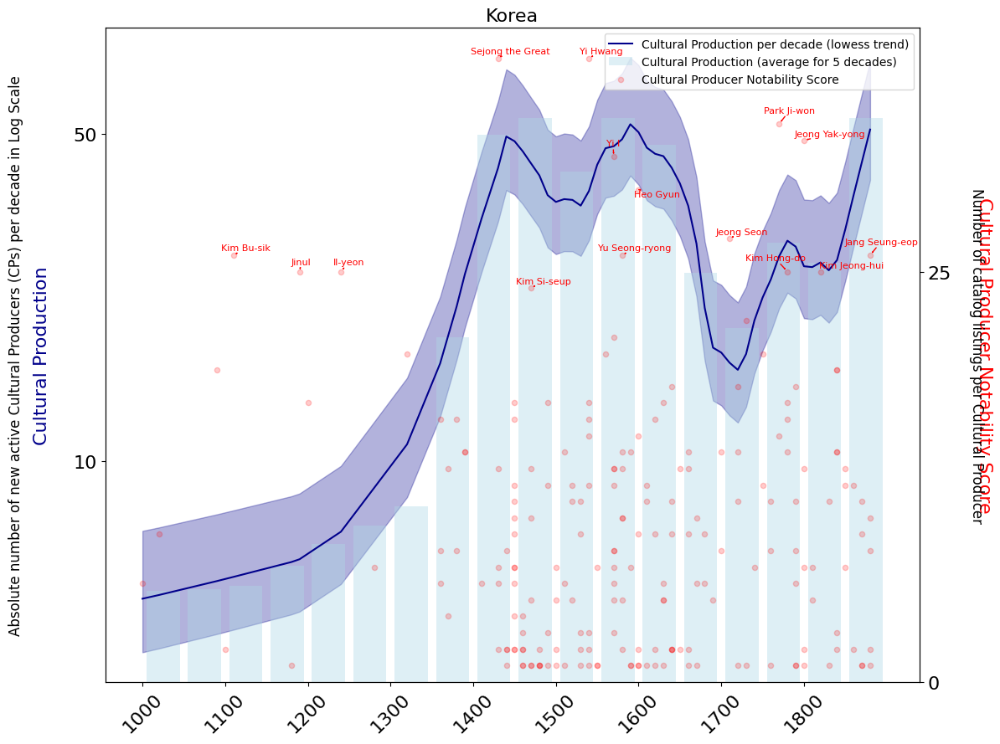

In [20]:
plot_figure(region_name='Korea',  min_year=1000, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.2)


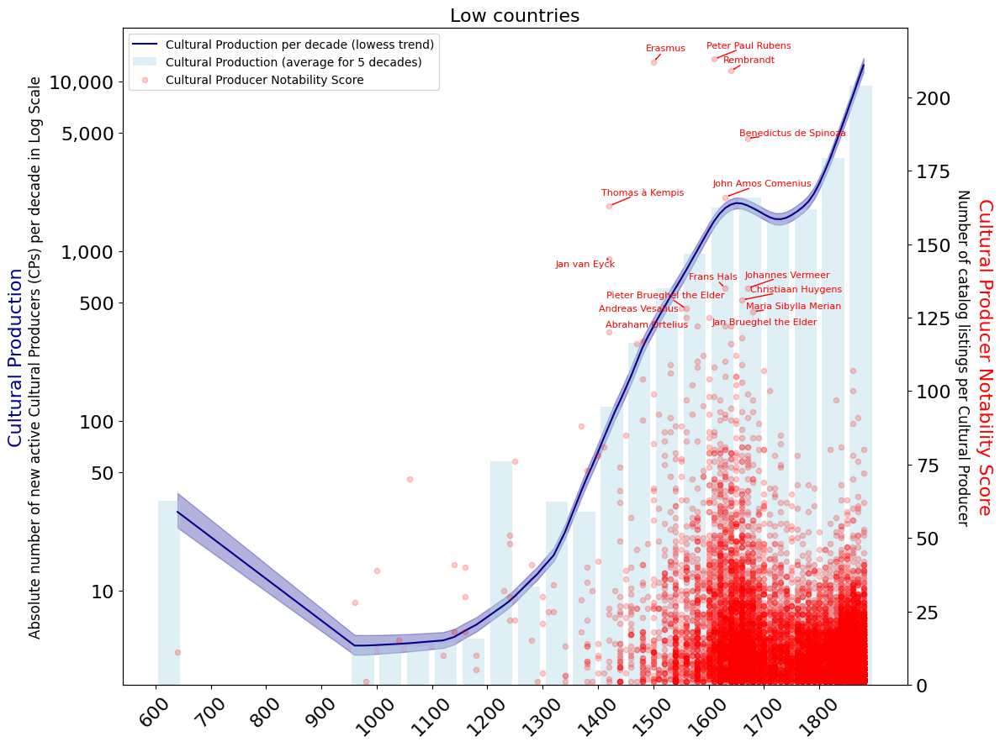

In [21]:
plot_figure(region_name='Low countries',  min_year=600, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.2)


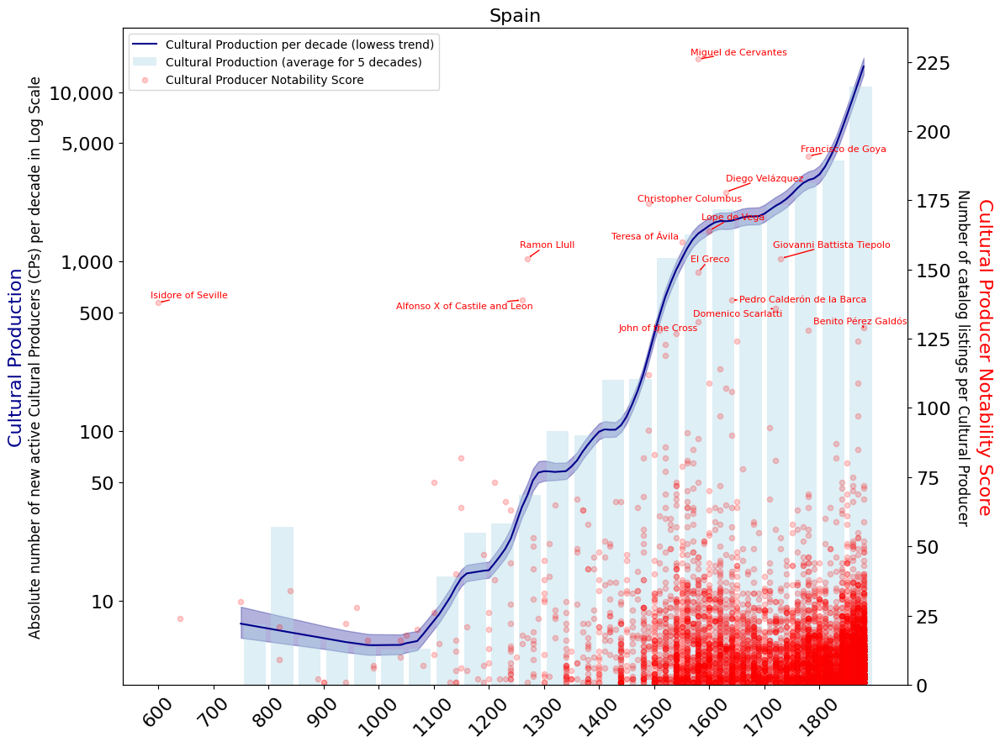

In [22]:
plot_figure(region_name='Spain',  min_year=600, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.15)

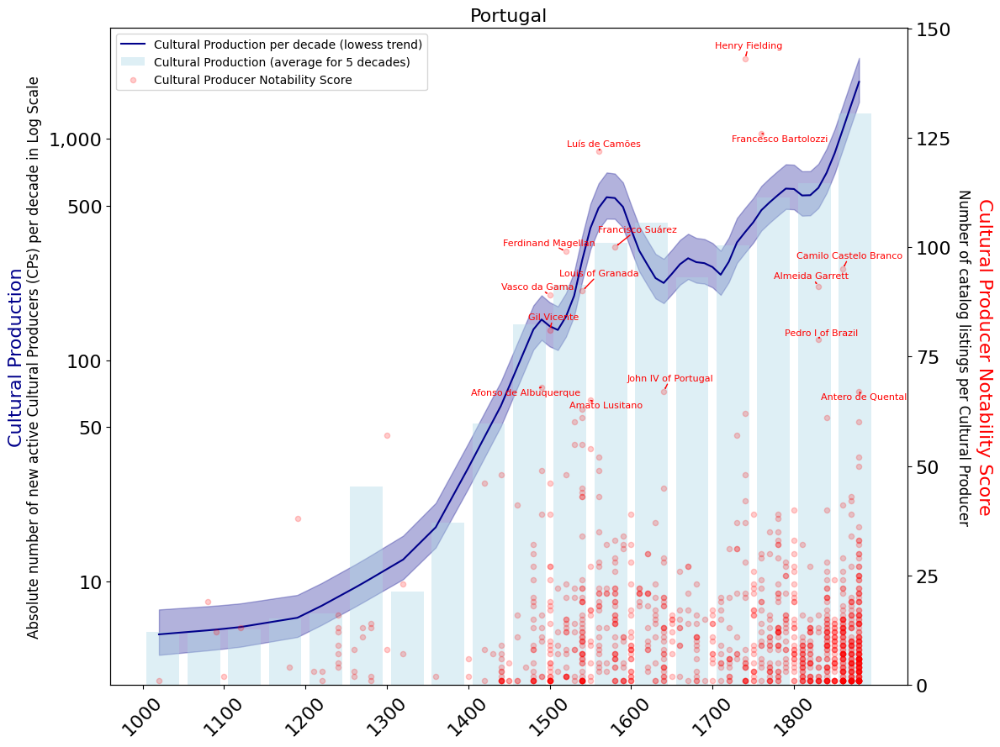

In [23]:
plot_figure(region_name='Portugal',  min_year=1000, max_year=1880,period_data=None, 
            year_step = 100, 
            plot_original_trend = False, 
            fifty=False, frac=0.15, first_axis_sub_text_location=-0.095)

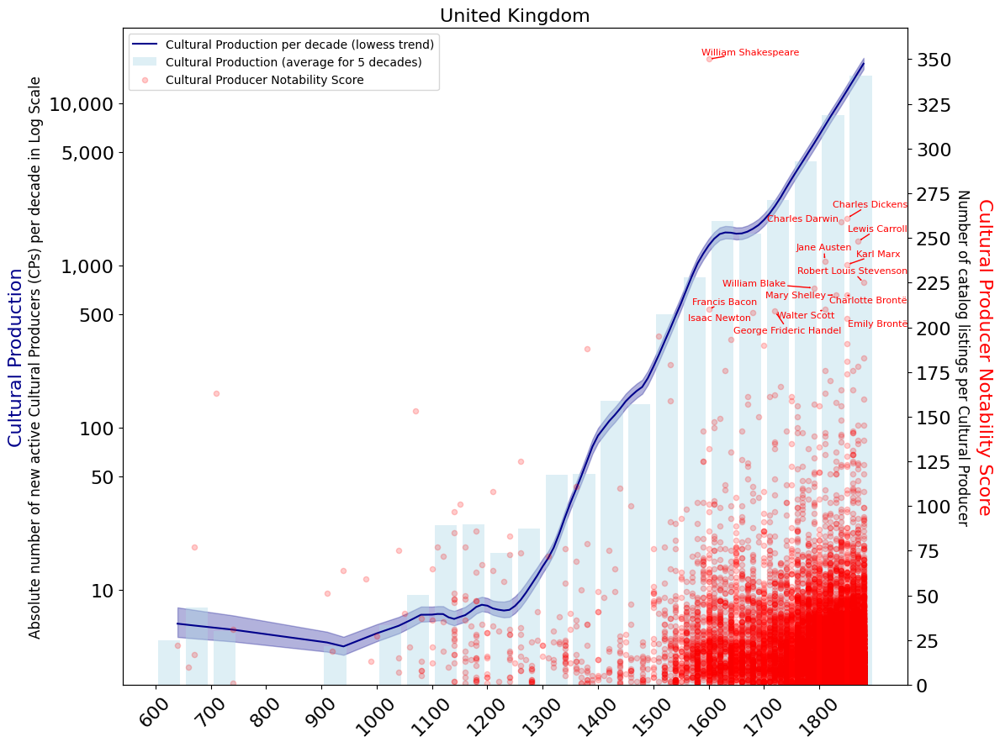

In [24]:
plot_figure(region_name='United Kingdom',  min_year=600, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.15)

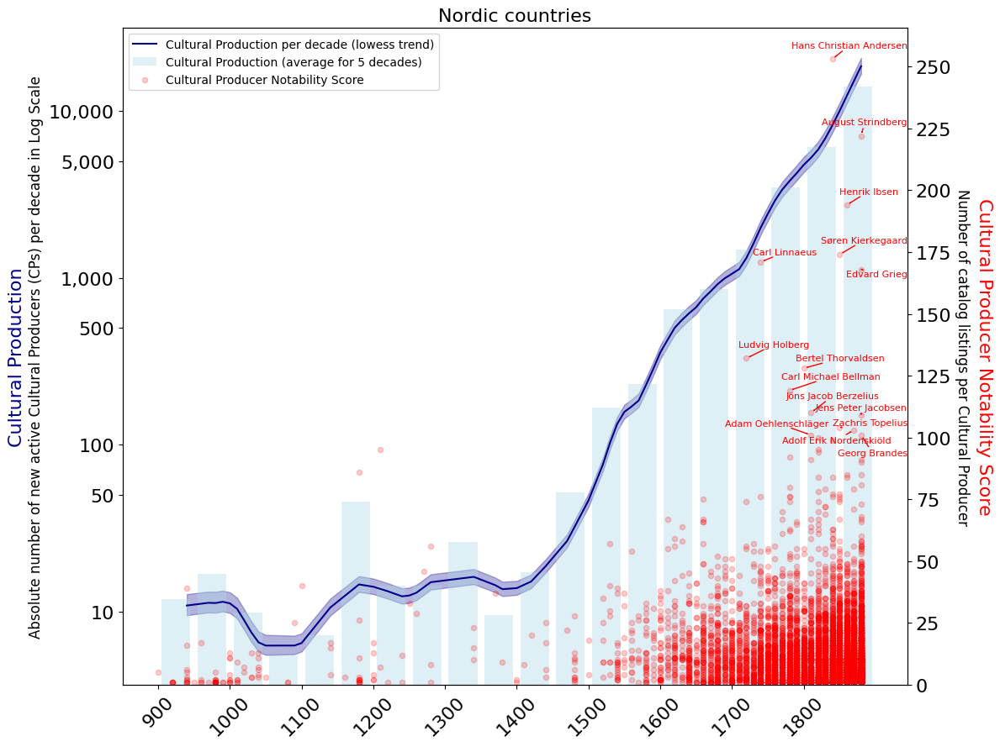

In [25]:
plot_figure(region_name='Nordic countries',  min_year=900, max_year=1880,period_data=None, year_step = 100, plot_original_trend = False, fifty=False, frac=0.15)

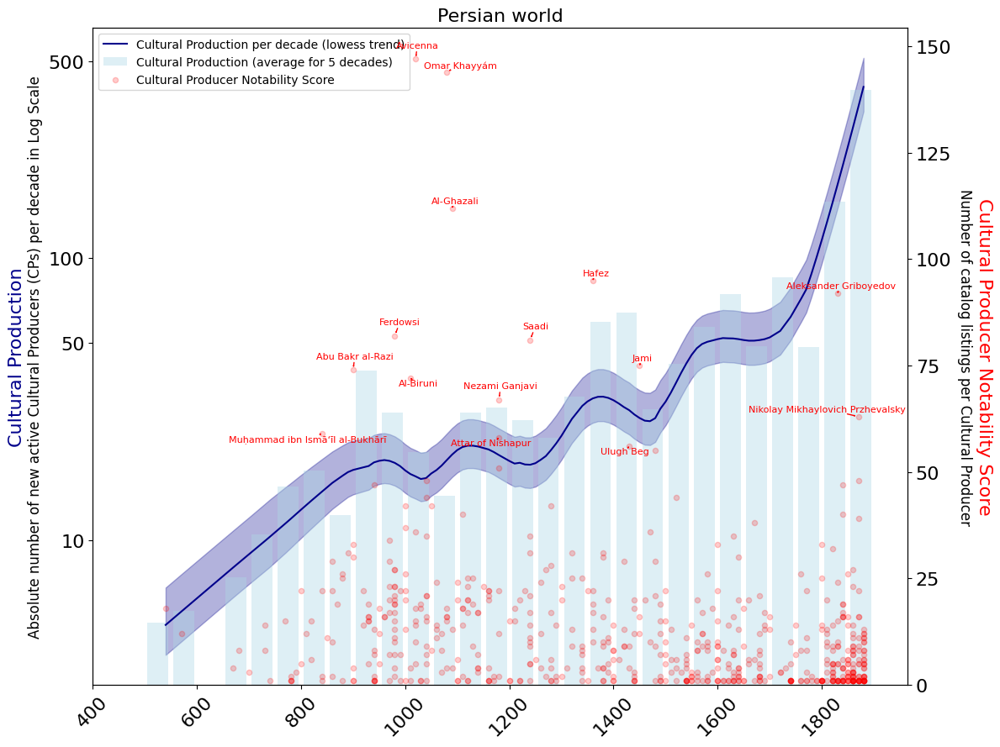

In [26]:
plot_figure(region_name='Persian world',  min_year=400, 
            max_year=1880,period_data=None, 
            year_step = 200, plot_original_trend = False, 
            fifty=False, frac=0.2,  first_axis_sub_text_location=-0.07)

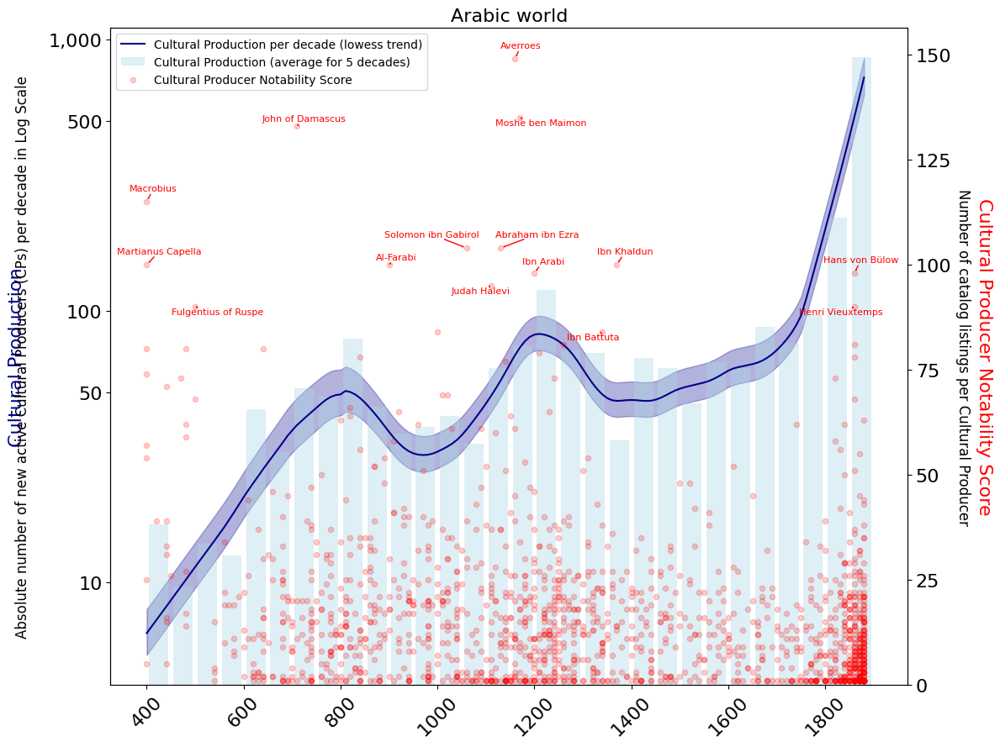

In [27]:
plot_figure(region_name='Arabic world',  min_year=400, max_year=1880,period_data=None, year_step = 200, plot_original_trend = False, fifty=False, frac=0.2)

In [28]:
df_cultura

,region_name,decade,N_est,N_est_min,N_est_max,score,f>3
0,MENA,-610,5.529170,3.469453,12.010166,1.0,0.0
1,MENA,-400,2.611448,2.070892,3.533070,1.0,0.0
2,MENA,-360,22.355402,17.292727,31.303071,5.0,1.0
3,MENA,-330,6.061846,4.709635,8.383012,1.0,0.0
4,MENA,-310,6.022250,4.717134,8.197015,1.0,0.0
...,...,...,...,...,...,...,...
2824,Western Europe,1840,12553.471136,11649.352286,13606.587402,1191.0,255.0
2825,Western Europe,1850,12547.101231,11614.735253,13621.204576,1112.0,203.0
2826,Western Europe,1860,15713.038693,14524.622840,17081.799422,1377.0,233.0
2827,Western Europe,1870,11936.644742,11040.216912,12956.160433,1084.0,172.0


In [29]:
# all_regions = ['MENA',
#  'Arabic world',
#  'Central Europe',
#  'Chinese world',
#  'East Slavic',
#  'France',
#  'German world',
#  'Greek World',
#  'Indian world',
#  'Italy',
#  'Japan',
#  'Korea',
#  'Latin World',
#  'Low countries',
#  'Nordic countries',
#  'Persian world',
#  'Portugal',
#  'Spain',
#  'United Kingdom',
#  'Western Europe']



# for region in all_regions:

#     min_year = min(df_cultura[df_cultura['region_name'] == region]['decade'])
#     max_year = max(df_cultura[df_cultura['region_name'] == region]['decade'])
    
#     plot_figure(region_name, max_year, min_year, period_data=None, year_step = 200, plot_original_trend = False, fifty=False, frac=0.1)





In [30]:
list(df_cultura['region_name'].unique())

['MENA',
 'Other',
 'Arabic world',
 'Central Europe',
 'Chinese world',
 'East Slavic',
 'France',
 'German world',
 'Greek World',
 'Indian world',
 'Italy',
 'Japan',
 'Korea',
 'Latin World',
 'Low countries',
 'Nordic countries',
 'Northern China',
 'Northern Japan',
 'Northwestern Europe',
 'Persian world',
 'Portugal',
 'Southern China',
 'Southern Japan',
 'Southwestern Europe',
 'Spain',
 'United Kingdom',
 'Western Europe']

In [31]:
# Japon : 600
# Korea : 1200
# Mena : 600


# Greek - Latin
# India - Mena
# Japan - France

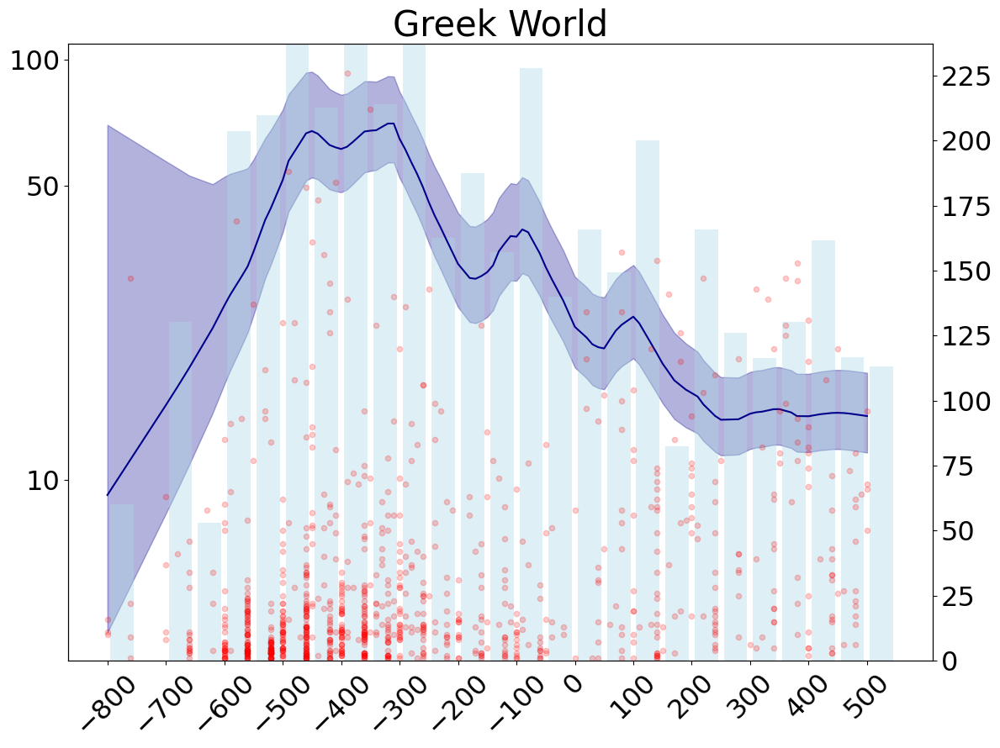

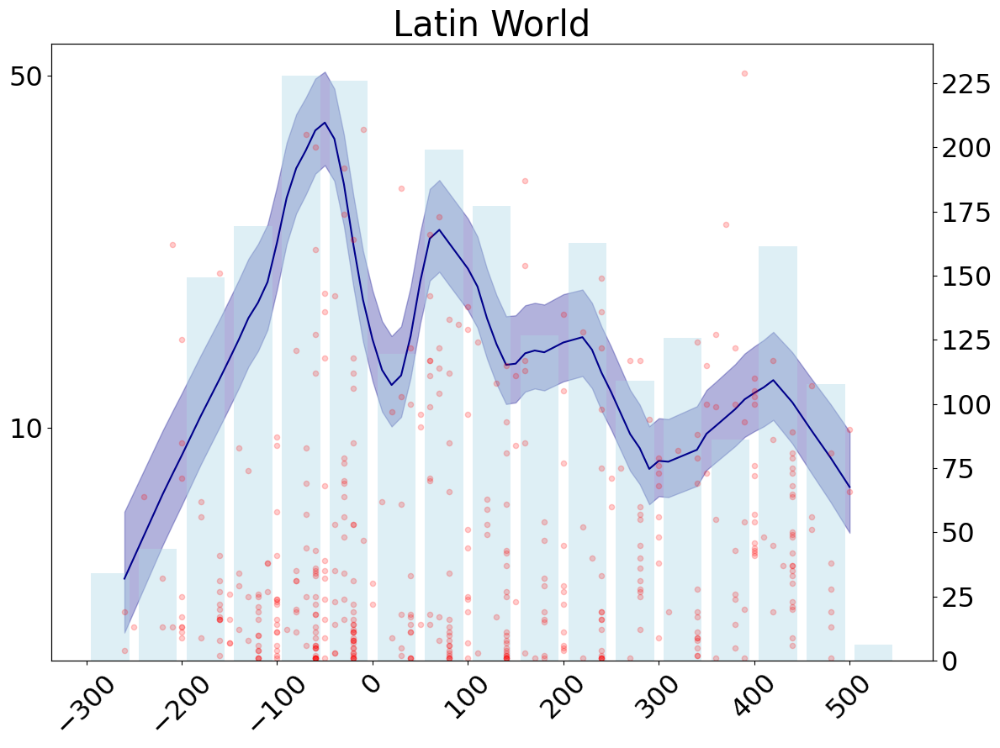

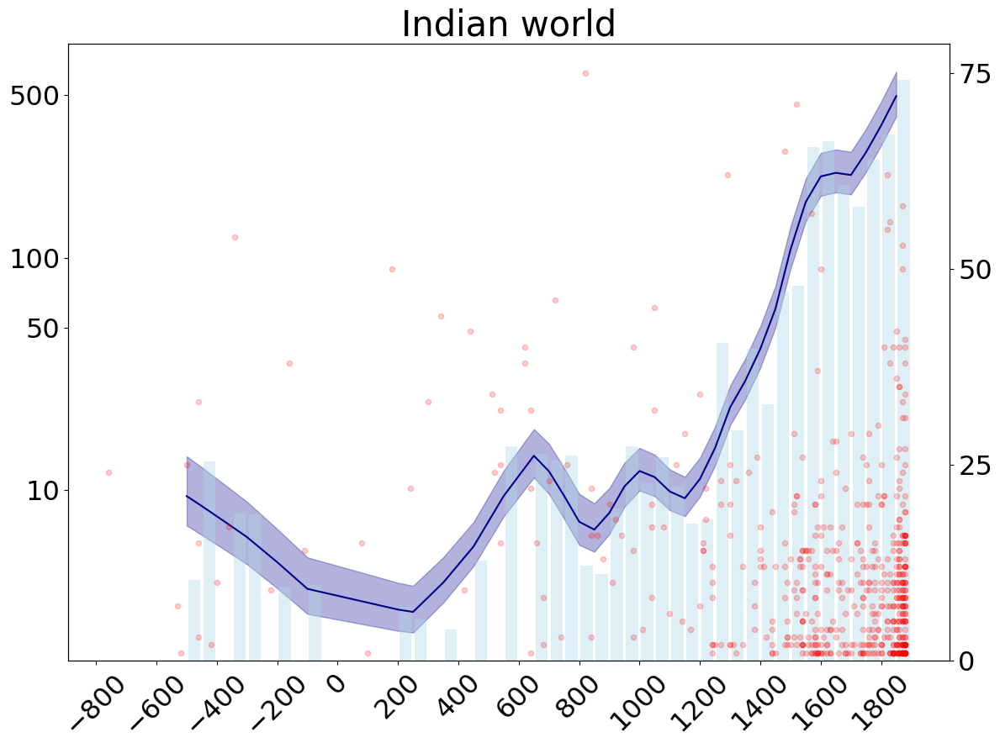

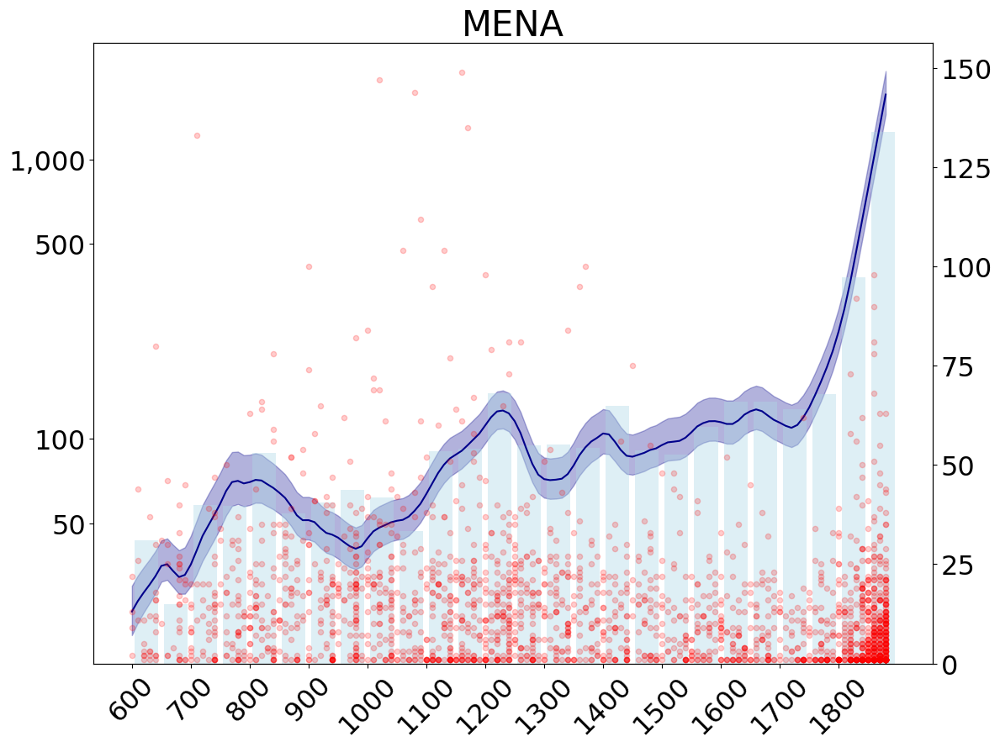

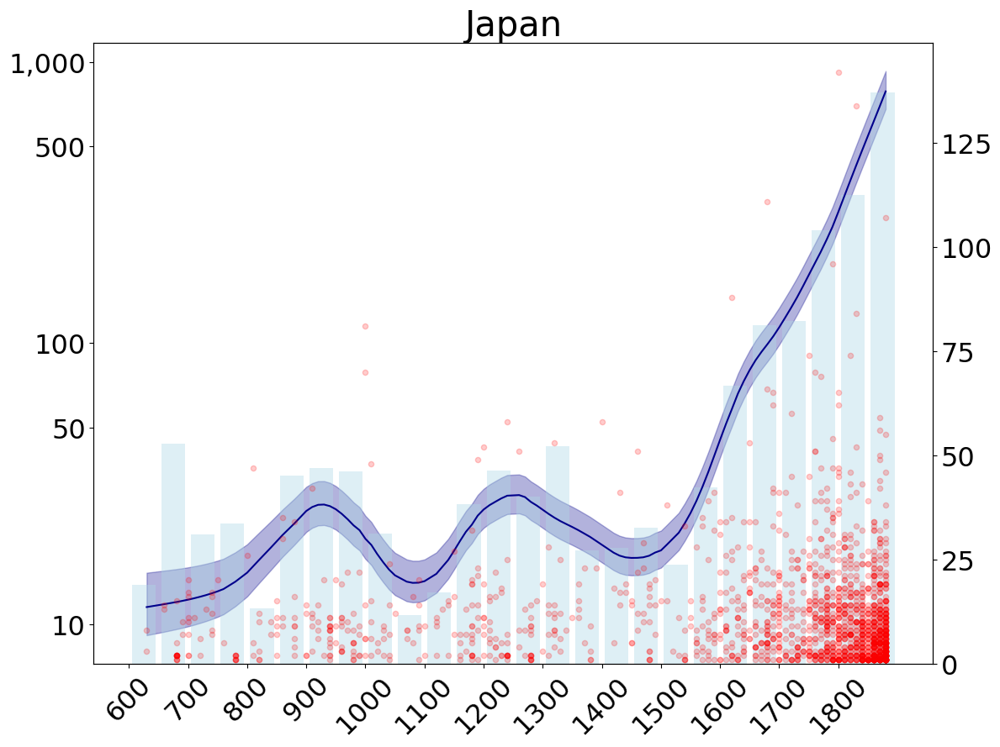

KeyboardInterrupt: 

In [32]:
fig_greek = plot_figure(region_name = 'Greek World', min_year = -800, max_year = 500,period_data = None,  year_step = 100, 
            plot_original_trend = False, plot_name_names=False, frac=0.2,   plot_names = True,
                fontsize_title=30,
                fontsize_axis_ticks = 23,
                fontsize_axis_name = 23,
                show_y_axis_titles = False,  
                show_legends = False)

fig_latin = plot_figure(region_name = 'Latin World', min_year = -300, max_year = 500,period_data = None,  year_step = 100, 
            plot_original_trend = False, plot_name_names=False, frac=0.2,   plot_names = True,
                fontsize_title=30,
                fontsize_axis_ticks = 23,
                fontsize_axis_name = 23,
                show_y_axis_titles = False,  
                show_legends = False)


fig_india = plot_figure(region_name = 'Indian world', min_year = -800, max_year = 1880,
            period_data = None,  fifty = True, year_step = 200, 
            plot_original_trend = False, frac=0.2,plot_name_names=False,fontsize_title=30,
                fontsize_axis_ticks = 23,
                show_y_axis_titles = False,  
                show_legends = False)

fig_mena = plot_figure(region_name = 'MENA', min_year = 600, max_year = 1880,period_data = None,  year_step = 100,  
            plot_original_trend = False, plot_name_names=False,fontsize_title=30,
                fontsize_axis_ticks = 23,
                show_y_axis_titles = False,  
                show_legends = False)

fig_japan = plot_figure(region_name = 'Japan', min_year = 600, max_year = 1880,period_data = None,  year_step = 100,  
            plot_original_trend = False, frac = 0.2, plot_name_names=False,fontsize_title=30,
                fontsize_axis_ticks = 23,
                show_y_axis_titles = False,  
                show_legends = False)


fig_france = plot_figure(region_name = 'France', min_year = 500, max_year = 1880,period_data = None,  year_step = 100,  
            plot_original_trend = False, plot_name_names=False,fontsize_title=30,
                fontsize_axis_ticks = 23,
                show_y_axis_titles = False,  
                show_legends = False)



## Main figure

In [ ]:
japanese_period_data = {
    "x_intercepts": [
        # [0, 300],
        # [300, 538],
        [538, 710],
        [710, 794],
        [794, 1185],
        [1185, 1333],
        [1333, 1600],
        [1600, 1800]
    ],
    "labels": [
        # "Yayoi period",
        # "Kofun period",
        "Asuka period",
        "Nara period",
        "Heian period",
        "Kamakura period",
        "Muromachi period",
        "Edo period"
    ]
}

### Plot 2 figures

In [ ]:
# Define a custom rounding function
def custom_round(x):
    if x >= 100000:
        return np.round(x, -5)  # Round to nearest 100000
    elif x >= 10000:
        return np.round(x, -4)  # Round to nearest 10000
    elif x >= 1000:
        return np.round(x, -3)  # Round to nearest 1000
    else:
        return np.round(x, -1)  # Round to nearest 10


def plot_figure(region_name, 
                max_year, 
                min_year, 
                period_data, 
                year_step = 200, 
                plot_names = True, 
                frac = 0.1, 
                top_n_individuals = 15,
                plot_bars = False,
                plot_original_trend = False,
                yticks = [5, 10, 50, 100, 500, 1000, 2000],
                fifty = False,
                log=True,
                legend=False,
                plot_name_names=True,
                fontsize_title=16,
                fontsize_axis_ticks = 16,
                fontsize_axis_name = 16):


    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name])]
        

    df = df_cultura[df_cultura['region_name'].isin([region_name])]

    if fifty:
            df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
            df = df.groupby(['region_name', 'decade']).sum().reset_index()



    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    if log:
        df['N_est'] = np.log(df['N_est'])  # Applying log transformation
        df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
        df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
        df['score'] = np.log(df['score'])  # Max bound log

    # Define your color scheme
    colors = {
        region_name: "#00008b",
    }

    fig, ax = plt.subplots(figsize=(12, 9))
    ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis


    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)


        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)


        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label ='Corrected Index', color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()


    if plot_original_trend:

            # Adding smoothing and plotting for each region
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)

                    # LOESS smoothing

            smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
            # smoothed_min = lowess(region_data['N_est_min'], region_data['decade'], frac=0.2)
            # smoothed_max = lowess(region_data['N_est_max'], region_data['decade'], frac=0.2)
            # Update maximum n_est if current is higher
            max_n_est = max(max_n_est, max(smoothed[:, 1]))

            # Plotting the smoothed mean estimate
            ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#006400', linewidth=3, linestyle='-')



    if plot_names:
        # Collect texts from each region separately and adjust
        # for region in df_individuals_filtered['region_name'].unique():
        region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
        region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')
        region_individuals = region_individuals.sort_values('score', ascending=False)
        top_individuals = region_individuals.head(top_n_individuals)

        # Plot scatter for all individuals
        all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
        ax2.scatter(region_individuals['decade'], all_scores_normalized, color='red', alpha=0.2, s=20)

        if plot_name_names:
            texts = []  # Initialize a new list for this region's texts

            # Texts for top 15
            for _, row in top_individuals.iterrows():
                score_normalized = (row['score'] / max_global_score) * max_n_est
                text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
                            ha='center', va='bottom', color='red',fontsize=8)
                texts.append(text)

            # Use adjust_text for the current region with the corresponding arrow color
            adjust_text(texts, arrowprops=dict(arrowstyle="->", color="red"))

    

    if period_data:
        # Adding labels and vertical lines for each period
        for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
            start, end = intercept
            midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
            # Add vertical line at the start of each period
            ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
            # Add text label at the midpoint of the period, shifted upwards
            ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')



    if plot_bars:
        # Plot bars from the real values
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)
            # Bars representing the scores
            ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha = 0.1, zorder=2)



    # Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
    ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size


    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')
    if log:
        ax.set_ylabel('Cultural Production (Log Scale)', fontsize = fontsize_axis_name)
        ax2.set_ylabel('Cultural Producer Score', fontsize = fontsize_axis_name)
    else:
         ax.set_ylabel('Cultural Production', fontsize = fontsize_axis_name)
    ax.set_title(region_name, fontsize = fontsize_title)
    
    if plot_original_trend:
        ax.legend()  # This will add the legend with labels as specified in plot commands
    else:
        ax.legend().remove()  # This conditionally removes the legend
    
    plt.show()

    return fig


In [ ]:
def plot_figures(region_name_1, 
                 region_name_2,
                    max_year, 
                    min_year, 
                    period_data, 
                    title,
                    year_step = 200, 
                    plot_names = True, 
                    frac = 0.1, 
                    top_n_individuals = 15,
                    plot_bars = False,
                    plot_original_trend = False,
                    fifty=False,
                    plot_name_names=True,
                    fontsize_title=16,
                    fontsize_axis_ticks = 16,
                    fontsize_axis_name = 16
                    ):


    


    df = df_cultura[df_cultura['region_name'].isin([region_name_1, region_name_2])]


    if fifty:
        df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
        df = df.groupby(['region_name', 'decade']).sum().reset_index()


    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    df['N_est'] = np.log(df['N_est'])  # Applying log transformation
    df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
    df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
    df['score'] = np.log(df['score'])  # Max bound log



    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name_1, region_name_2])]
    # Define your color scheme
    colors = {
        region_name_1: "#00bfc4",
        region_name_2: "#f8766d"
    }


    fig, ax = plt.subplots(figsize=(12, 9))
    ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis


    # # List for storing text annotations for later adjustment
    # texts = []

    # # Calculate the maximum smoothed value for normalization
    # max_n_est = float('-inf')

    # # Adding smoothing and plotting for each region
    # for region in df['region_name'].unique():
    #     region_data = df[df['region_name'] == region]
    #     region_data.sort_values(by='decade', inplace=True)


    #     # LOESS smoothing
    #     smoothed = lowess(region_data['N_est'], region_data['decade'], frac=frac)
    #     smoothed_min = lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
    #     smoothed_max = lowess(region_data['N_est_max'], region_data['decade'], frac=frac)

    #     # Update maximum n_est if current is higher
    #     max_n_est = max(max_n_est, max(smoothed[:, 1]))

    #     # Plotting the smoothed mean estimate
    #     ax.plot(smoothed[:, 0], smoothed[:, 1], label=region, color=colors[region])

    #     # Plotting the confidence interval as a fill between
    #     ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # # Calculate the maximum score for all individuals for normalization
    # max_global_score = df_individuals_filtered['score'].max()



    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)


        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)


        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label ='Corrected Index', color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()


    if plot_names:
        # Collect texts from each region separately and adjust
        # for region in df_individuals_filtered['region_name'].unique():
        region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
        region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')
        region_individuals = region_individuals.sort_values('score', ascending=False)
        top_individuals = region_individuals.head(top_n_individuals)

        # Plot scatter for all individuals
        all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
        ax2.scatter(region_individuals['decade'], all_scores_normalized, color='red', alpha=0.2, s=20)

        if plot_name_names:
            texts = []  # Initialize a new list for this region's texts

            # Texts for top 15
            for _, row in top_individuals.iterrows():
                score_normalized = (row['score'] / max_global_score) * max_n_est
                text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
                            ha='center', va='bottom', color='red',fontsize=8)
                texts.append(text)

            # Use adjust_text for the current region with the corresponding arrow color
            adjust_text(texts, arrowprops=dict(arrowstyle="->", color="red"))

    


    # if plot_names:
    #     # Collect texts from each region separately and adjust
    #     for region in df_individuals_filtered['region_name'].unique():
    #         region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
    #         region_individuals = region_individuals.sort_values('score', ascending=False)
    #         top_individuals = region_individuals.head(top_n_individuals).sort_values('score', ascending=False)
    #         texts = []  # Initialize a new list for this region's texts

    #         # Plot scatter for all individuals
    #         all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
    #         ax.scatter(region_individuals['decade'], all_scores_normalized, color=colors[region], alpha=0.2, s=20)

    #         if plot_name_names:
    #             # Texts for top 15
    #             for _, row in top_individuals.iterrows():
    #                 score_normalized = (row['score'] / max_global_score) * max_n_est
    #                 text = ax.text(row['decade'], score_normalized, row['individual_name'], 
    #                             ha='center', va='bottom', color=colors[region],fontsize=8)
    #                 texts.append(text)

    #             # Use adjust_text for the current region with the corresponding arrow color
    #             adjust_text(texts, arrowprops=dict(arrowstyle="->", color=colors[region]))

    

    if period_data:
        # Adding labels and vertical lines for each period
        for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
            start, end = intercept
            midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
            # Add vertical line at the start of each period
            ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
            # Add text label at the midpoint of the period, shifted upwards
            ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')



    if plot_bars:
        # Plot bars from the real values
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)
            # Bars representing the scores
            ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha = 0.2, zorder=2)


    # # Define specific y-ticks and convert them to log scale for plotting
    # yticks = [5, 10, 50, 100, 500, 1000, 2000]
    # yticks_log = np.log(yticks)  # Convert yticks to their logarithmic values

    # ax.set_yticks(yticks_log)  # Set the logarithmic y-ticks
    # ax.set_yticklabels([str(y) for y in yticks])  # Use original y-tick labels


    #  # Get current y-axis ticks (which are in log scale)
    # ticks_log = ax.get_yticks()

    # # Calculate the original values from the log scale ticks
    # ticks_original = np.exp(ticks_log)  # Adjust if a different base is used for logging

    # # Round to the nearest 10

    # ticks_rounded = [custom_round(tick) for tick in ticks_original]

    # #ticks_rounded = np.around(ticks_original / 10) * 10

    # # Remove duplicates, keeping only the last occurrence
    # unique_ticks = {}
    # for tick, original in zip(ticks_rounded, ticks_log):
    #     unique_ticks[tick] = original  # This will overwrite the tick with its last occurrence

    # # Now, set the ticks and labels, skipping duplicates
    # final_ticks = sorted(unique_ticks.items())  # Sort ticks by their values
    # ax.set_yticks([item[1] for item in final_ticks])  # Set the unique tick positions
    # ax.set_yticklabels(['{:.0f}'.format(item[0]) for item in final_ticks])  # Set the unique tick labels



    
# Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
    ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size


    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')
  
    ax.set_ylabel('Cultural Production (Log Scale)', fontsize = fontsize_axis_name)
    ax2.set_ylabel('Cultural Producer Score', fontsize = fontsize_axis_name)

    ax.set_title(title, fontsize = fontsize_title)

    if plot_original_trend:
        ax.legend()  # This will add the legend with labels as specified in plot commands
    else:
        ax.legend().remove()  # This conditionally removes the legend

        plt.show()



In [ ]:
# # Define a custom rounding function
# def custom_round(x):
#     if x >= 100000:
#         return np.round(x, -5)  # Round to nearest 100000
#     elif x >= 10000:
#         return np.round(x, -4)  # Round to nearest 10000
#     elif x >= 1000:
#         return np.round(x, -3)  # Round to nearest 1000
#     else:
#         return np.round(x, -1)  # Round to nearest 10


# def plot_figure(region_name, 
#                 max_year, 
#                 min_year, 
#                 period_data, 
#                 year_step = 200, 
#                 plot_names = True, 
#                 frac = 0.1, 
#                 top_n_individuals = 15,
#                 plot_bars = False,
#                 plot_original_trend = False,
#                 yticks = [5, 10, 50, 100, 500, 1000, 2000],
#                 fifty = False,
#                 log=True,
#                 legend=False,
#                 plot_name_names=True,
#                 fontsize_title=16,
#                 fontsize_axis_ticks = 16,
#                 fontsize_axis_name = 16):


#     df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
#     df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name])]
        

#     df = df_cultura[df_cultura['region_name'].isin([region_name])]

#     if fifty:
#             df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
#             df = df.groupby(['region_name', 'decade']).sum().reset_index()



#     df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

#     if log:
#         df['N_est'] = np.log(df['N_est'])  # Applying log transformation
#         df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
#         df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
#         df['score'] = np.log(df['score'])  # Max bound log

#     # Define your color scheme
#     colors = {
#         region_name: "#00008b",
#     }

#     fig, ax = plt.subplots(figsize=(12, 9))
#     ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis


#     # List for storing text annotations for later adjustment
#     texts = []

#     # Calculate the maximum smoothed value for normalization
#     max_n_est = float('-inf')

#     # Adding smoothing and plotting for each region
#     for region in df['region_name'].unique():
#         region_data = df[df['region_name'] == region]
#         region_data.sort_values(by='decade', inplace=True)


#         # LOESS smoothing
#         smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
#         smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
#         smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)


#         # Update maximum n_est if current is higher
#         max_n_est = max(max_n_est, max(smoothed[:, 1]))

#         # Plotting the smoothed mean estimate
#         ax.plot(smoothed[:, 0], smoothed[:, 1], label ='Corrected Index', color=colors[region])

#         # Plotting the confidence interval as a fill between
#         ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

#     # Calculate the maximum score for all individuals for normalization
#     max_global_score = df_individuals_filtered['score'].max()


#     if plot_original_trend:

#             # Adding smoothing and plotting for each region
#         for region in df['region_name'].unique():
#             region_data = df[df['region_name'] == region]
#             region_data.sort_values(by='decade', inplace=True)

#                     # LOESS smoothing

#             smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
#             # smoothed_min = lowess(region_data['N_est_min'], region_data['decade'], frac=0.2)
#             # smoothed_max = lowess(region_data['N_est_max'], region_data['decade'], frac=0.2)
#             # Update maximum n_est if current is higher
#             max_n_est = max(max_n_est, max(smoothed[:, 1]))

#             # Plotting the smoothed mean estimate
#             ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#006400', linewidth=3, linestyle='-')



#     if plot_names:
#         # Collect texts from each region separately and adjust
#         # for region in df_individuals_filtered['region_name'].unique():
#         region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
#         region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')
#         region_individuals = region_individuals.sort_values('score', ascending=False)
#         top_individuals = region_individuals.head(top_n_individuals)

#         # Plot scatter for all individuals
#         all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
#         ax2.scatter(region_individuals['decade'], all_scores_normalized, color='red', alpha=0.2, s=20)

#         if plot_name_names:
#             texts = []  # Initialize a new list for this region's texts

#             # Texts for top 15
#             for _, row in top_individuals.iterrows():
#                 score_normalized = (row['score'] / max_global_score) * max_n_est
#                 text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
#                             ha='center', va='bottom', color='red',fontsize=8)
#                 texts.append(text)

#             # Use adjust_text for the current region with the corresponding arrow color
#             adjust_text(texts, arrowprops=dict(arrowstyle="->", color="red"))

    

#     if period_data:
#         # Adding labels and vertical lines for each period
#         for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
#             start, end = intercept
#             midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
#             # Add vertical line at the start of each period
#             ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
#             # Add text label at the midpoint of the period, shifted upwards
#             ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')



#     if plot_bars:
#         # Plot bars from the real values
#         for region in df['region_name'].unique():
#             region_data = df[df['region_name'] == region]
#             region_data.sort_values(by='decade', inplace=True)
#             # Bars representing the scores
#             ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha = 0.1, zorder=2)



#     # Set the size of x-axis and y-axis tick labels
#     ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
#     ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
#     ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size


#     ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
#     # Rotating x-ticks by 45 degrees for better readability
#     ax.tick_params(axis='x', rotation=45)
#     ax.set_xlabel('')
#     if log:
#         ax.set_ylabel('Cultural Production (Log Scale)', fontsize = fontsize_axis_name)
#         ax2.set_ylabel('Cultural Producer Score', fontsize = fontsize_axis_name)
#     else:
#          ax.set_ylabel('Cultural Production', fontsize = fontsize_axis_name)
#     ax.set_title(region_name, fontsize = fontsize_title)
    
#     if plot_original_trend:
#         ax.legend()  # This will add the legend with labels as specified in plot commands
#     else:
#         ax.legend().remove()  # This conditionally removes the legend
    
#     plt.show()

#     return fig


In [ ]:
def plot_figures(region_name_1, 
                 region_name_2,
                    max_year, 
                    min_year, 
                    period_data, 
                    title,
                    year_step = 200, 
                    plot_names = True, 
                    frac = 0.1, 
                    top_n_individuals = 15,
                    plot_bars = False,
                    plot_original_trend = False,
                    fifty=False,
                    plot_name_names=True,
                    fontsize_title=16,
                    fontsize_axis_ticks = 16,
                    fontsize_axis_name = 16
                    ):

    df = df_cultura[df_cultura['region_name'].isin([region_name_1, region_name_2])]

    if fifty:
        df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
        df = df.groupby(['region_name', 'decade']).sum().reset_index()

    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    df['N_est'] = np.log(df['N_est'])  # Applying log transformation
    df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
    df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
    df['score'] = np.log(df['score'])  # Max bound log

    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name_1, region_name_2])]
    
    # Define your color scheme
    colors = {
        region_name_1: "#00bfc4",
        region_name_2: "#f8766d"
    }

    fig, ax = plt.subplots(figsize=(12, 9))
    ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis

    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)

        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)

        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label=region, color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()

    if plot_original_trend:
        # Adding smoothing and plotting for each region
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)

            # LOESS smoothing
            smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
            
            # Update maximum n_est if current is higher
            max_n_est = max(max_n_est, max(smoothed[:, 1]))

            # Plotting the smoothed mean estimate with different colors for original trend
            if region == region_name_1:
                ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#006400', linewidth=3, linestyle='-')
            else:  # region_name_2
                ax.plot(smoothed[:, 0], smoothed[:, 1], label='Original Index', color='#8B4513', linewidth=3, linestyle='-')

    if plot_names:
        # Collect texts from each region separately and adjust
        for region in df_individuals_filtered['region_name'].unique():
            region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
            region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')  # Add this line
            region_individuals = region_individuals.sort_values('score', ascending=False)
            top_individuals = region_individuals.head(top_n_individuals)

            # Plot scatter for all individuals - CHANGE: Use ax2 instead of ax
            all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
            ax2.scatter(region_individuals['decade'], all_scores_normalized, color=colors[region], alpha=0.2, s=20)

            if plot_name_names:
                texts = []  # Initialize a new list for this region's texts
                
                # Texts for top individuals - CHANGE: Use ax2 instead of ax
                for _, row in top_individuals.iterrows():
                    score_normalized = (row['score'] / max_global_score) * max_n_est
                    text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
                                ha='center', va='bottom', color=colors[region], fontsize=8)
                    texts.append(text)

                # Use adjust_text for the current region with the corresponding arrow color
                adjust_text(texts, arrowprops=dict(arrowstyle="->", color=colors[region]))

    if period_data:
        # Adding labels and vertical lines for each period
        for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
            start, end = intercept
            midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
            # Add vertical line at the start of each period
            ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
            # Add text label at the midpoint of the period, shifted upwards
            ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')

    if plot_bars:
        # Plot bars from the real values
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)
            # Bars representing the scores
            ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha = 0.2, zorder=2)

    # Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
    ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size

    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every 200 years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')
  
    ax.set_ylabel('Cultural Production (Log Scale)', fontsize = fontsize_axis_name)
    ax2.set_ylabel('Cultural Producer Score', fontsize = fontsize_axis_name)

    ax.set_title(title, fontsize = fontsize_title)

    if plot_original_trend:
        ax.legend()  # This will add the legend with labels as specified in plot commands
    else:
        ax.legend().remove()  # This conditionally removes the legend

    plt.show()
    return fig  # Add this line to match the single region function

In [ ]:
def plot_two_figures(region_name_1, 
                     region_name_2,
                     max_year, 
                     min_year, 
                     period_data, 
                     title,
                     year_step = 200, 
                     plot_names = True, 
                     frac = 0.1, 
                     top_n_individuals = 15,
                     plot_bars = False,
                     plot_original_trend = False,
                     yticks = [5, 10, 50, 100, 500, 1000, 2000],
                     fifty = False,
                     log = True,
                     legend = False,
                     plot_name_names = True,
                     fontsize_title = 16,
                     fontsize_axis_ticks = 16,
                     fontsize_axis_name = 16,
                     show_real_values = True,
                     first_axis_sub_text_location = -0.11,
                     plot_histogram = False,
                     histogram_bin_years = 50,  # NEW PARAMETER: controls histogram bin size in years
                     show_y_axis_titles = True,  # NEW PARAMETER: controls y-axis titles visibility
                     show_legends = True,
                    legend_loc= 'upper left'):  # NEW PARAMETER: controls legend visibility

    # Filter data for both regions
    df_individuals_filtered = df_individuals[(df_individuals['decade']<=max_year)&(df_individuals['decade']>=min_year)]
    df_individuals_filtered = df_individuals_filtered[df_individuals_filtered['region_name'].isin([region_name_1, region_name_2])]
        
    df = df_cultura[df_cultura['region_name'].isin([region_name_1, region_name_2])]

    if fifty:
        df['decade'] = df['decade'].apply(lambda x: int(x) + (50 - int(x) % 50))
        df = df.groupby(['region_name', 'decade']).sum().reset_index()

    df = df[(df['decade'] <=max_year) & (df['decade']>=min_year)]

    # Store original values before log transformation
    df_original = df.copy()
    
    # Create histogram bins based on the new parameter
    if plot_histogram:
        # Create bins of the specified size for both regions combined
        df_hist = df_original.copy()
        if histogram_bin_years == 10:  # Per decade
            df_hist['year_bin'] = df_hist['decade']  # Use decade as is
            df_hist_grouped = df_hist.groupby('year_bin')['N_est'].mean().reset_index()
            df_hist_grouped['year_bin_center'] = df_hist_grouped['year_bin']
            bar_width = 8  # Narrower bars for decades
        else:  # For any other bin size (50 years, 100 years, etc.)
            df_hist['year_bin'] = (df_hist['decade'] // histogram_bin_years) * histogram_bin_years
            df_hist_grouped = df_hist.groupby('year_bin')['N_est'].mean().reset_index()
            df_hist_grouped['year_bin_center'] = df_hist_grouped['year_bin'] + (histogram_bin_years / 2)  # Center of each bin
            bar_width = histogram_bin_years * 0.8  # Bar width proportional to bin size
    
    if log:
        df['N_est'] = np.log(df['N_est'])  # Applying log transformation
        df['N_est_min'] = np.log(df['N_est_min'])  # Min bound log
        df['N_est_max'] = np.log(df['N_est_max'])  # Max bound log
        df['score'] = np.log(df['score'])  # Max bound log

    # Define your color scheme for two regions
    colors = {
        region_name_1: "#00bfc4",
        region_name_2: "#f8766d"
    }

    fig, ax = plt.subplots(figsize=(12, 9))
    ax2 = ax.twinx()  # Create a second y-axis that shares the same x-axis

    # List for storing text annotations for later adjustment
    texts = []

    # Calculate the maximum smoothed value for normalization
    max_n_est = float('-inf')

    # Adding smoothing and plotting for each region
    for region in df['region_name'].unique():
        region_data = df[df['region_name'] == region]
        region_data.sort_values(by='decade', inplace=True)

        # LOESS smoothing
        smoothed = sm.nonparametric.lowess(region_data['N_est'], region_data['decade'], frac=frac)
        smoothed_min = sm.nonparametric.lowess(region_data['N_est_min'], region_data['decade'], frac=frac)
        smoothed_max = sm.nonparametric.lowess(region_data['N_est_max'], region_data['decade'], frac=frac)

        # Update maximum n_est if current is higher
        max_n_est = max(max_n_est, max(smoothed[:, 1]))

        # Plotting the smoothed mean estimate
        ax.plot(smoothed[:, 0], smoothed[:, 1], label=f'{region} Cultural Production per decade (lowess trend)', color=colors[region])

        # Plotting the confidence interval as a fill between
        ax.fill_between(smoothed[:, 0], smoothed_min[:, 1], smoothed_max[:, 1], color=colors[region], alpha=0.3)

    # Store y-axis limits before adding histogram to maintain consistent scaling
    y_limits_after_line = ax.get_ylim()
    
    # Plot histogram bars with configurable bin size (combined for both regions)
    if plot_histogram:
        if log:
            # Convert histogram values to log scale for plotting
            hist_log_values = np.log(df_hist_grouped['N_est'])
            ax.bar(df_hist_grouped['year_bin_center'], hist_log_values, 
                   width=bar_width, alpha=0.4, color='lightblue', 
                   label=f'Cultural Production (average for {histogram_bin_years//10} decades)', zorder=1)
        
        # Restore the y-axis limits to what they were before adding the histogram
        ax.set_ylim(y_limits_after_line)

    # Calculate the maximum score for all individuals for normalization
    max_global_score = df_individuals_filtered['score'].max()

    if plot_original_trend:
        # Adding smoothing and plotting for each region
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)

            # LOESS smoothing
            smoothed = sm.nonparametric.lowess(region_data['score'], region_data['decade'], frac=frac)
            
            # Update maximum n_est if current is higher
            max_n_est = max(max_n_est, max(smoothed[:, 1]))

            # Plotting the smoothed mean estimate with different colors for original trend
            if region == region_name_1:
                ax.plot(smoothed[:, 0], smoothed[:, 1], label=f'{region} Original Index', color='#006400', linewidth=3, linestyle='-')
            else:  # region_name_2
                ax.plot(smoothed[:, 0], smoothed[:, 1], label=f'{region} Original Index', color='#8B4513', linewidth=3, linestyle='-')

    if plot_names:
        # Collect texts from each region separately and adjust
        for region in df_individuals_filtered['region_name'].unique():
            region_individuals = df_individuals_filtered[df_individuals_filtered['region_name'] == region]
            region_individuals = region_individuals.drop_duplicates('individual_wikidata_id', keep='first')
            region_individuals = region_individuals.sort_values('score', ascending=False)
            top_individuals = region_individuals.head(top_n_individuals)

            # Plot scatter for all individuals
            all_scores_normalized = (region_individuals['score'] / max_global_score) * max_n_est
            ax2.scatter(region_individuals['decade'], all_scores_normalized, color=colors[region], alpha=0.2, s=20, 
                       label=f'{region} Cultural Producer Notability Score')

            if plot_name_names:
                texts = []  # Initialize a new list for this region's texts

                # Texts for top individuals
                for _, row in top_individuals.iterrows():
                    score_normalized = (row['score'] / max_global_score) * max_n_est
                    text = ax2.text(row['decade'], score_normalized, row['individual_name'], 
                                ha='center', va='bottom', color=colors[region], fontsize=8)
                    texts.append(text)

                # Use adjust_text for the current region with the corresponding arrow color
                adjust_text(texts, arrowprops=dict(arrowstyle="->", color=colors[region]))

    if period_data:
        # Adding labels and vertical lines for each period
        for intercept, label in zip(period_data['x_intercepts'], period_data['labels']):
            start, end = intercept
            midpoint = (start + end) / 2  # Calculate the midpoint of each period
            
            # Add vertical line at the start of each period
            ax.axvline(x=start, color='lightgrey', linestyle='dotted', linewidth=2)
            
            # Add text label at the midpoint of the period, shifted upwards
            ax.text(midpoint, ax.get_ylim()[1] * 0.7, label, rotation=90, verticalalignment='center', fontsize=10, color='grey')

    if plot_bars:
        # Plot bars from the real values
        for region in df['region_name'].unique():
            region_data = df[df['region_name'] == region]
            region_data.sort_values(by='decade', inplace=True)
            # Bars representing the scores
            ax.bar(region_data['decade'], region_data['N_est'], label=region, color=colors[region], width=10, alpha=0.1, zorder=2)

    # Add real values annotations if requested and using log scale
    if show_real_values and log:
        # Get some representative points to show real values for both regions
        for region in df_original['region_name'].unique():
            region_data_orig = df_original[df_original['region_name'] == region]
            region_data_orig.sort_values(by='decade', inplace=True)
            
            # Get the smoothed line data for this region
            smoothed = sm.nonparametric.lowess(df[df['region_name'] == region]['N_est'], 
                                             df[df['region_name'] == region]['decade'], 
                                             frac=frac)
            
            # Select every few points to avoid cluttering
            step = max(1, len(smoothed) // 4)  # Show about 6 points
            sample_indices = range(0, len(smoothed), step)
            
            for i in sample_indices:
                if i < len(smoothed):
                    decade = smoothed[i, 0]
                    smoothed_log_value = smoothed[i, 1]
                    
                    # Convert the smoothed log value back to real value
                    real_value_from_smoothed = np.exp(smoothed_log_value)

    # Set custom y-ticks to show the relationship between log and real values
    if log and show_real_values:
        # Create custom ticks that correspond to nice real values for primary y-axis
        real_tick_values = [10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000]
        log_tick_values = [np.log(val) for val in real_tick_values]
        
        # Filter to only include ticks within the data range
        y_min, y_max = ax.get_ylim()
        valid_ticks = [(log_val, real_val) for log_val, real_val in zip(log_tick_values, real_tick_values) 
                       if y_min <= log_val <= y_max]
        
        if valid_ticks:
            log_ticks, real_labels = zip(*valid_ticks)
            ax.set_yticks(log_ticks)
            ax.set_yticklabels([f'{int(val):,}' for val in real_labels])
        
        # Set custom y-ticks for secondary y-axis (Cultural Producer Score)
        if plot_names:
            # Get the range of normalized scores on ax2
            y2_min, y2_max = ax2.get_ylim()
            
            # Convert normalized positions back to original score values to determine range
            if max_n_est > 0:
                original_score_min = (y2_min * max_global_score) / max_n_est
                original_score_max = (y2_max * max_global_score) / max_n_est
                
                # Create ticks every 25 units in original score space
                tick_start = int(np.ceil(original_score_min / 25) * 25)  # Round up to next 25
                tick_end = int(np.floor(original_score_max / 25) * 25)   # Round down to prev 25
                
                original_score_ticks = list(range(tick_start, tick_end + 1, 25))
                
                # Convert back to normalized positions for plotting
                normalized_tick_positions = [(score * max_n_est) / max_global_score for score in original_score_ticks]
                
                # Filter to only include ticks within the actual y-axis range
                valid_ticks = [(norm_pos, orig_score) for norm_pos, orig_score in zip(normalized_tick_positions, original_score_ticks) 
                              if y2_min <= norm_pos <= y2_max]
                
                if valid_ticks:
                    norm_positions, orig_scores = zip(*valid_ticks)
                    ax2.set_yticks(norm_positions)
                    ax2.set_yticklabels([f'{int(score):,}' for score in orig_scores])

    # Set the size of x-axis and y-axis tick labels
    ax.tick_params(axis='x', labelsize=fontsize_axis_ticks)  # Increase x-axis tick label size
    ax.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size
    ax2.tick_params(axis='y', labelsize=fontsize_axis_ticks)  # Increase y-axis tick label size

    # Set y-axis limits to start from 0 for the secondary axis
    if plot_names:
        y2_min, y2_max = ax2.get_ylim()
        ax2.set_ylim(bottom=0)

    ax.set_xticks(np.arange(min_year, max_year + 1, year_step))  # Set x-ticks every specified years
    # Rotating x-ticks by 45 degrees for better readability
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('')

    STROKE = 1.3

    # Y-axis titles (controlled by show_y_axis_titles parameter)
    if show_y_axis_titles:
        if log:
            if show_real_values:
                # Create the main y-label in a neutral color since we have two regions
                ax.set_ylabel('Cultural Production', fontsize=fontsize_axis_name, labelpad=20, color='black')
                # Position smaller text further left and lower in black
                ax.text(first_axis_sub_text_location, 0.5, 'Absolute number of new active Cultural Producers (CPs) per decade in Log Scale', 
                        transform=ax.transAxes, fontsize=fontsize_axis_name*0.75, 
                        rotation=90, ha='center', va='center', color='black')

            if plot_names and show_real_values:
                # Create the secondary y-label in black for two-region comparison
                ax2.set_ylabel('Cultural Producer Notability Score', fontsize=fontsize_axis_name, labelpad=35, rotation=-90, color='black')
                ax2.text(1.07, 0.50, "Number of catalog listings per Cultural Producer", 
                        transform=ax2.transAxes, fontsize=fontsize_axis_name*0.75, 
                        rotation=-90, ha='center', va='center', color='black')
            else:
                ax2.set_ylabel('Cultural Producer Score', fontsize=fontsize_axis_name, labelpad=20, color='black')
        else:
            ax.set_ylabel('Cultural Production', fontsize=fontsize_axis_name, color='black')
            if plot_names:
                ax2.set_ylabel('Cultural Producer Score', fontsize=fontsize_axis_name, color='black')
    
    ax.set_title(title, fontsize=fontsize_title)
    
# Legend handling (controlled by show_legends parameter)
    if show_legends:
        if plot_original_trend or plot_histogram or plot_names:
            # Combine legends from both axes
            lines1, labels1 = ax.get_legend_handles_labels()
            if plot_names:
                lines2, labels2 = ax2.get_legend_handles_labels()
                ax.legend(lines1 + lines2, labels1 + labels2, loc=legend_loc)
            else:
                ax.legend(loc=legend_loc)
        else:
            ax.legend().remove()  # This conditionally removes the legend
    else:
        # Remove any existing legends when show_legends is False
        legend = ax.get_legend()
        if legend:
            legend.remove()
    
    plt.tight_layout()  # Add this to prevent label cutoff
    plt.show()


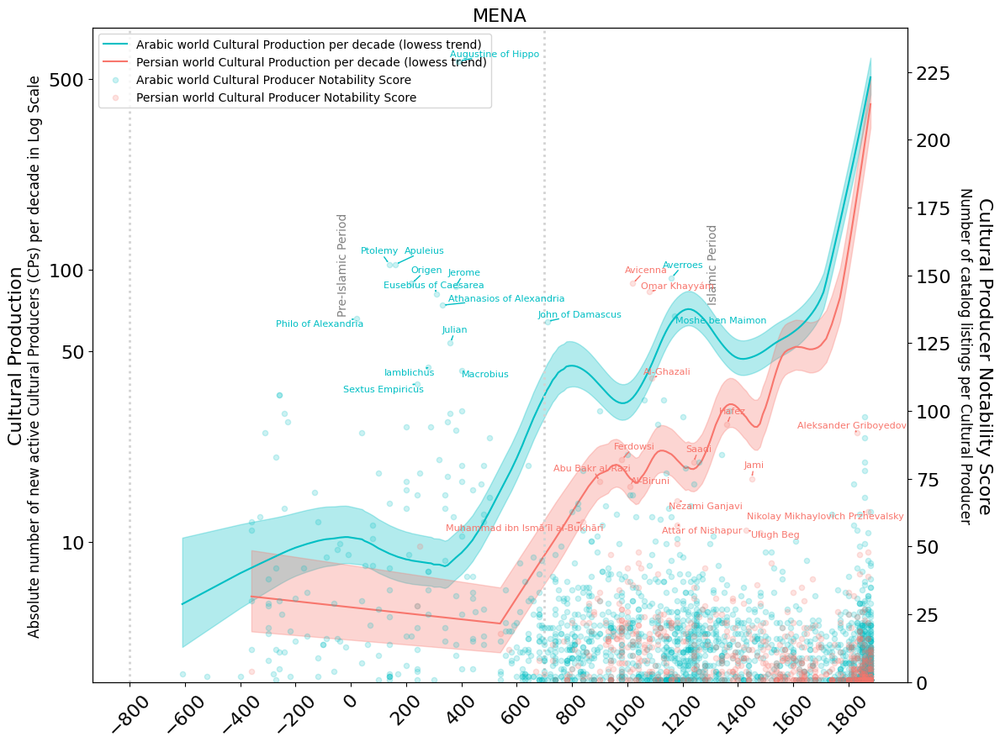

In [ ]:

plot_two_figures(region_name_1="Arabic world", 
        region_name_2='Persian world',
            max_year = 1880, 
            min_year = -800, 
            title='MENA',
            period_data = {
            "x_intercepts": [
                [-800, 700],
                [700, 1880],
            
            ],
            "labels": [
                "Pre-Islamic Period",
                "Islamic Period",
            ]
        }, 
            year_step = 200, 
            plot_names = True, 
            frac = 0.2, 
            top_n_individuals = 15,
            plot_bars = False,
            plot_original_trend = False,
            fifty=False,
            plot_name_names=True,  first_axis_sub_text_location=-0.07)

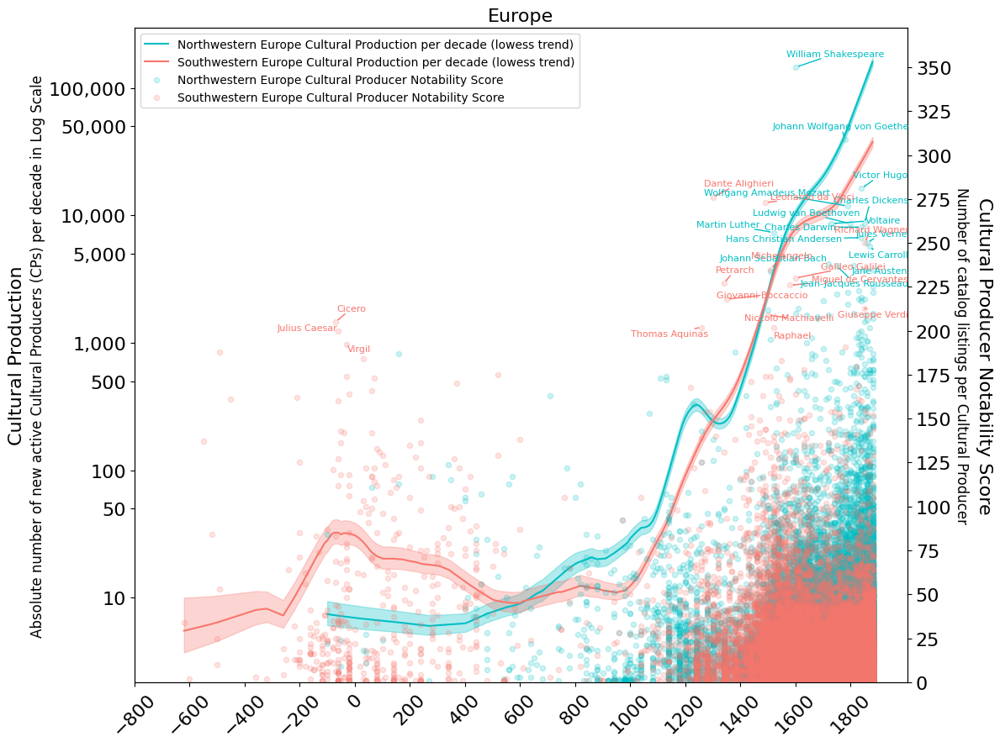

In [ ]:
plot_two_figures(region_name_1="Northwestern Europe", 
        region_name_2='Southwestern Europe',
            max_year = 1880, 
            min_year = -800, 
            title='Europe',
            period_data = None, 
            year_step = 200, 
            plot_names = True, 
            frac = 0.15, 
            top_n_individuals = 15,
            plot_bars = False,
            plot_original_trend = False, fifty = False, first_axis_sub_text_location=-0.125)

In [ ]:
list(set(df_cultura.region_name))

['Persian world',
 'Nordic countries',
 'Arabic world',
 'Chinese world',
 'Portugal',
 'Indian world',
 'Other',
 'German world',
 'Southern China',
 'MENA',
 'Northern China',
 'Southwestern Europe',
 'Low countries',
 'Spain',
 'Latin World',
 'East Slavic',
 'Korea',
 'United Kingdom',
 'Greek World',
 'France',
 'Italy',
 'Japan',
 'Northwestern Europe',
 'Northern Japan',
 'Central Europe',
 'Southern Japan',
 'Western Europe']

In [ ]:
list(set(df_cultura.region_name))

['Persian world',
 'Nordic countries',
 'Arabic world',
 'Chinese world',
 'Portugal',
 'Indian world',
 'Other',
 'German world',
 'Southern China',
 'MENA',
 'Northern China',
 'Southwestern Europe',
 'Low countries',
 'Spain',
 'Latin World',
 'East Slavic',
 'Korea',
 'United Kingdom',
 'Greek World',
 'France',
 'Italy',
 'Japan',
 'Northwestern Europe',
 'Northern Japan',
 'Central Europe',
 'Southern Japan',
 'Western Europe']

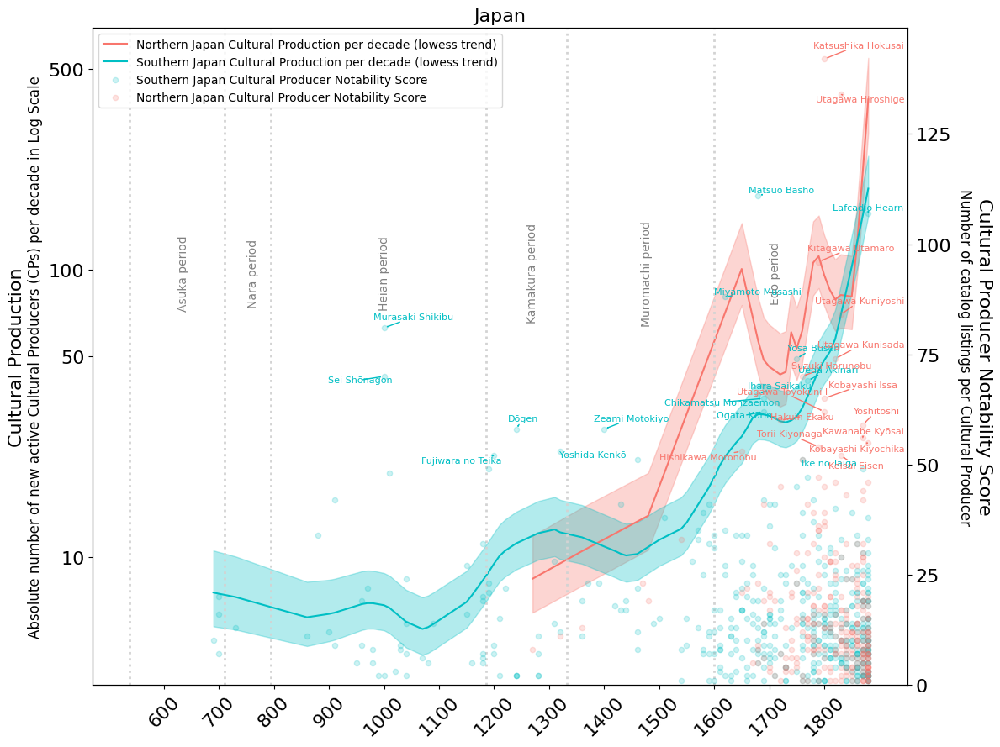

In [ ]:
plot_two_figures(region_name_1="Southern Japan", 
        region_name_2="Northern Japan",
            max_year = 1880,
            min_year = 600, 
            title='Japan',
            period_data =japanese_period_data, 
            year_step = 100, 
            plot_names = True, 
            frac = 0.2, 
            top_n_individuals = 15,
            plot_bars = False,
            plot_original_trend = False, 
            fifty = False, first_axis_sub_text_location=-0.07)

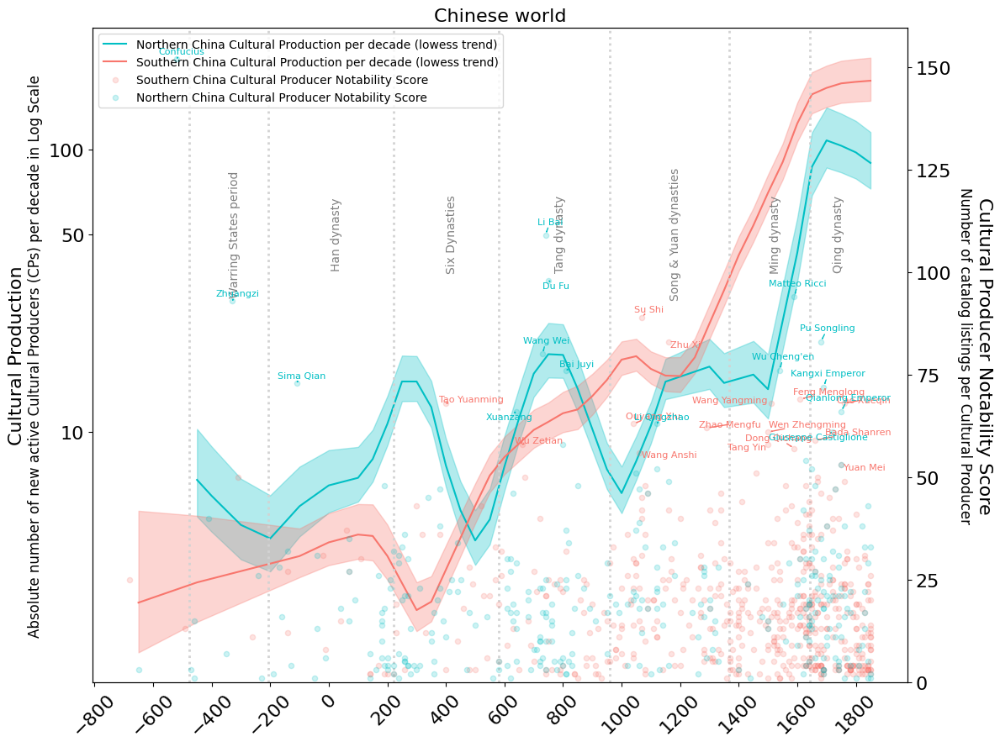

In [ ]:
plot_two_figures(region_name_1="Northern China", 
        region_name_2='Southern China',
            max_year = 1850, 
            min_year = -800, 
            title='Chinese world',
            period_data =chinese_period_data, 
            year_step = 200, 
            plot_names = True, 
            frac = 0.2, 
            top_n_individuals = 15,
            plot_bars = False,
            plot_original_trend = False, 
            fifty = True, first_axis_sub_text_location=-0.07)

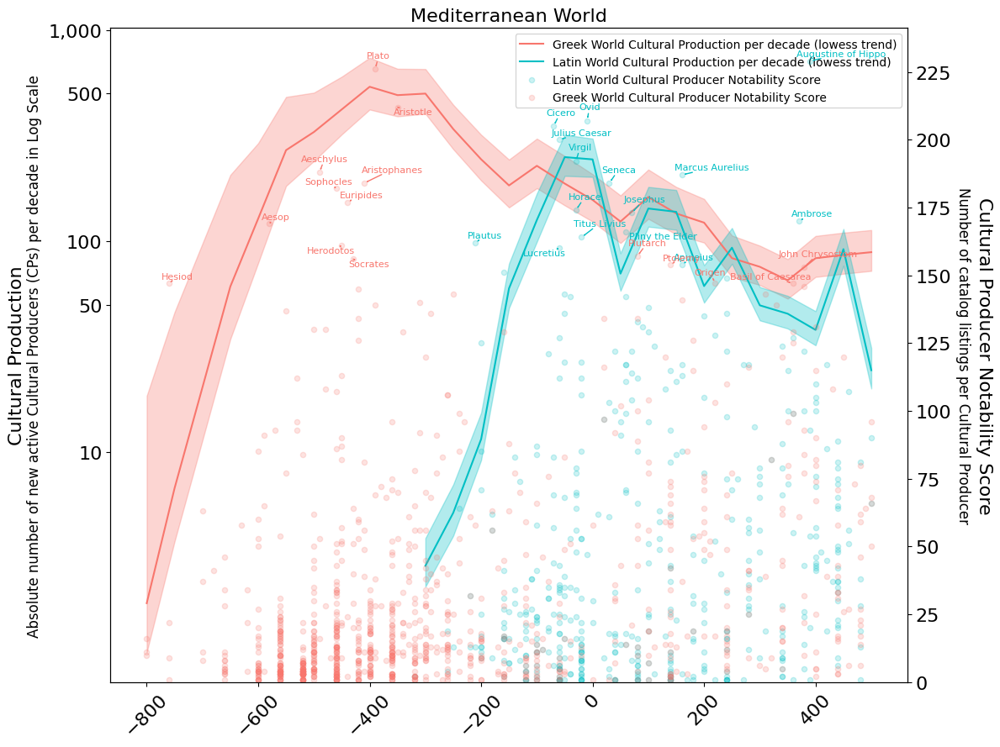

In [ ]:
plot_two_figures(region_name_1="Latin World", 
        region_name_2='Greek World',
            max_year = 500, 
            min_year = -800, 
            title='Mediterranean World',
            period_data =None, 
            year_step = 200, 
            plot_names = True, 
            frac = 0.2, 
            top_n_individuals = 15,
            plot_bars = False,
            plot_original_trend = False, 
            fifty = True,legend_loc = 'upper right', first_axis_sub_text_location=-0.095)

### Plot Western Europe

In [ ]:
plot = False

if plot:

    from dotenv import load_dotenv
    import sqlite3
    import os

    load_dotenv()

    DB_PATH = os.getenv("DB_PATH")

    conn = sqlite3.connect(DB_PATH)
    cursor = conn.cursor()

    df_western = df_cultura_original.copy()

    df_country = pd.read_sql_query("SELECT * FROM individuals_main_information", conn)
    df_country = df_country[df_country['country_name'].isin(['Tunisia', 'Morocco', 'Algeria'])]
    df_country = df_country[df_country['birthyear']<=535]

    df_western = df_western[~df_western['individual_wikidata_id'].isin(list(df_country['individual_wikidata_id']))]


    # remove individuals belonging to #before 500 to Tunisia, Morocco and Algeria

    df_western['N_est'] = df_western['f0'] + df_western['f1'] + df_western['f2']# plus the individual
    df_western['N_est_min']  =  df_western['min_f0'] + df_western['f1'] + df_western['f2']# plus the individual
    df_western['N_est_max']  =  df_western['max_f0'] + df_western['f1'] + df_western['f2']# plus the individual

    df_cultura = df_western.groupby(['region_name', 'decade']).agg({'N_est': 'sum', 'N_est_min':'sum', 'N_est_max':'sum', 'individual_wikidata_id':'count'}).reset_index()
    df_cultura = df_cultura.rename(columns={"individual_wikidata_id": "score"})

    # Load individuals Data
    df_individuals = pd.read_csv('/Users/charlesdedampierre/Desktop/cultura_project/immaterial_index/results/df_individuals_score.csv', index_col = [0])


    # Add indiviudals not taken into account into the unseen-species model
    df_works = pd.read_csv('db_extract/df_indi__work>2.csv', index_col=[0])
    df_works = df_works.groupby(['decade', 'region_name'])['individual_wikidata_id'].count().reset_index()
    df_works = df_works.rename(columns = {'individual_wikidata_id':'f>3'})

    df_cultura = pd.merge(df_cultura, df_works, on = ['region_name', 'decade'], how='left')
    df_cultura = df_cultura.fillna(0)


    df_cultura['N_est'] = df_cultura['N_est'] + df_cultura['f>3']
    df_cultura['N_est_min'] = df_cultura['N_est_min'] + df_cultura['f>3']
    df_cultura['N_est_max'] = df_cultura['N_est_max'] + df_cultura['f>3']
    df_cultura['score'] = df_cultura['score'] + df_cultura['f>3']



    regions_eu = ['Latin World',
    'Portugal',
    'Italy',
    #  'Greek World',
    'Spain',
    'Nordic countries',
    'German world',
    'Low countries',
    'France',
    'United Kingdom']

    df_cultura = df_cultura[df_cultura['region_name'].isin(regions_eu)]
    df_cultura['region_name'] = 'Western Europe'

    plot_figure(region_name = 'Western Europe', min_year = -800, max_year = 1850, period_data = None,  year_step = 100,  plot_original_trend = False, fifty=True)

In [ ]:
# or just add Italy, France

# British Islands (After 500 CE)
# France (After 500 CE)
# German world (After 500 CE)
# Portugal (After 500 CE)
# Spain (after 500 CE)
# Italy (after 500 CE)
# Low countries (After 500 CE)
# Nordic countries (After 500 CE)